In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pickle

import esmdmsfunctions
from esmdmsfunctions import *

from popDMS import infer_gamma_range

In [2]:
bg_path = "~/popDMS/esmDMS/data/inference_data/BG505"
bf_path = "~/popDMS/esmDMS/data/inference_results"

In [4]:
#def infer_gamma_range(embedding_df, n_replicates=1, 
#                      gamma_values=None, max_reads=1e2):

In [3]:
_, true_sel_coeffs, _, gamma_data, _,  = get_simulation_results(50, embedding_df_path=bf_path,
                                        sel_func=gaussian_selection, inference=False,
                                        gamma_analysis=True, layers=[0, 6, 12, 18, 24, 30])

Running layer 0...
Running simulation...
Transferring simulation data to inference dataframe format...
Running inference calculations on simulated data...
Running layer 6...
Running simulation...
Transferring simulation data to inference dataframe format...
Running inference calculations on simulated data...
Running layer 12...
Running simulation...


/net/dali/home/barton/dhw28/popDMS/esmDMS/esmdmsfunctions.py:856: RuntimeWarning: invalid value encountered in divide
  probabilities = (current_counts * fitnesses) / total_fitness


ValueError: pvals < 0, pvals > 1 or pvals contains NaNs

In [28]:
# now analyze!!!
"""true_sel_coeffs = simdata[1][0]
gamma_data = simdata[3][0]
gamma_vals = gamma_data[0]
rep_sels = gamma_data[1]
s_joint_by_gamma = gamma_data[2]"""

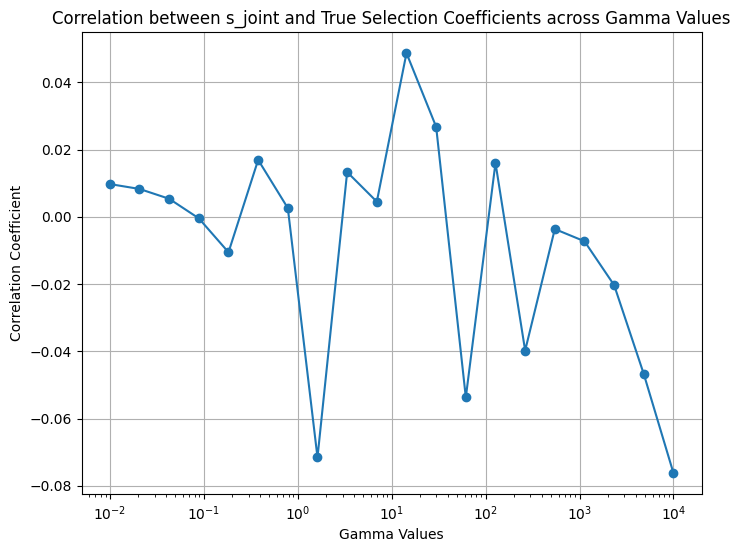

In [33]:
# Calculate the correlation coefficient between s_joint and true_sel_coeffs for all s_joint
all_corr_coeffs = []
norm_true_sel_coeffs = (true_sel_coeffs - np.mean(true_sel_coeffs)) / np.std(true_sel_coeffs)
for s_joint in s_joint_by_gamma:
    norm_s_joint = (s_joint - np.mean(s_joint)) / np.std(s_joint)
    corr_coeff = np.corrcoef(norm_s_joint, norm_true_sel_coeffs)[0, 1]
    all_corr_coeffs.append(corr_coeff)
    #print(f"Correlation coefficient for s_joint: {corr_coeff}")
    # Plot the selection coefficients
    """plt.figure(figsize=(8, 6))
    plt.scatter(true_sel_coeffs, s_joint, alpha=0.5)
    plt.xlabel("True Selection Coefficients")
    plt.ylabel("Inferred s_joint")
    plt.title(f"s_joint vs True Selection Coefficients (Corr: {corr_coeff:.2f})")
    plt.grid()
    # make it square
    plt.axis('equal')
    plt.show()"""
# Plot the correlation coefficients across gamma values
plt.figure(figsize=(8, 6))
plt.plot(gamma_vals, all_corr_coeffs, marker='o')
plt.xlabel("Gamma Values")
plt.ylabel("Correlation Coefficient")
plt.title("Correlation between s_joint and True Selection Coefficients across Gamma Values")
plt.grid()
# make x log
plt.xscale('log')
plt.show()
    
    
    

In [ ]:
layers = [18, 24, 30]

for layer in layers:
    _, true_sel_coeffs, _, gamma_data, _,  = get_simulation_results(50, embedding_df_path=bf_path,
                                        sel_func=gaussian_selection, inference=False,
                                        gamma_analysis=True, layers=[layer], fitness='exp')
    layer_true_sel_coeffs = true_sel_coeffs[layer]
    layer_s_joint = gamma_data[layer][2]
    norm_true_sel_coeffs = (layer_true_sel_coeffs - np.mean(layer_true_sel_coeffs)) / np.std(layer_true_sel_coeffs)
    layer_corrs = []
    for s_joint in layer_s_joint:
        norm_s_joint = (s_joint - np.mean(s_joint)) / np.std(s_joint)
        corr_coeff = np.corrcoef(norm_s_joint, norm_true_sel_coeffs)[0, 1]
        layer_corrs.append(corr_coeff)
    gamma_vals = gamma_data[layer][0]
    plt.figure(figsize=(8, 6))
    plt.plot(gamma_vals, layer_corrs, marker='o')
    plt.xlabel("Gamma Values")
    plt.ylabel("Correlation Coefficient")
    plt.title(f"Correlation between s_joint and True Selection Coefficients across Gamma Values (Layer {layer})")
    plt.grid()
    plt.xscale('log')
    plt.savefig(f"correlation_layer_{layer}.png")
    plt.show()
    
    # plot the replicate correlations with each other by gamma
    rep_sels_by_gamma = gamma_data[layer][1]
    average_correlations = []
    for gamma_idx in range(len(gamma_vals)):
        rep_sels = rep_sels_by_gamma[gamma_idx]
        correlations = []
        for i in range(len(rep_sels)):
            for j in range(i + 1, len(rep_sels)):
                corr_coeff = np.corrcoef(rep_sels[i], rep_sels[j])[0, 1]
                correlations.append(corr_coeff)
        average_correlation = np.mean(correlations)
        average_correlations.append(average_correlation)
                
    
    plt.figure(figsize=(8, 6))
    plt.plot(gamma_vals, average_correlations, marker='o')
    plt.xlabel("Gamma Values")
    plt.ylabel("Average Correlation between Replicates")
    plt.title(f"Average Correlation between Replicates across Gamma Values (Layer {layer})")
    plt.grid()
    plt.xscale('log')
    plt.savefig(f"correlation_by_gamma_layer_{layer}.png")
    plt.show()
    
    

Running layer 12...
Running simulation...
Transferring simulation data to inference dataframe format...
Running inference calculations on simulated data...


KeyError: 0

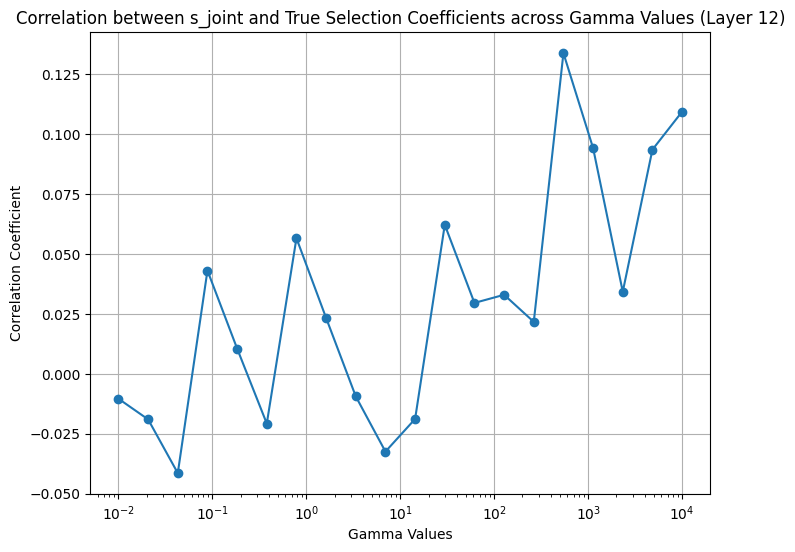

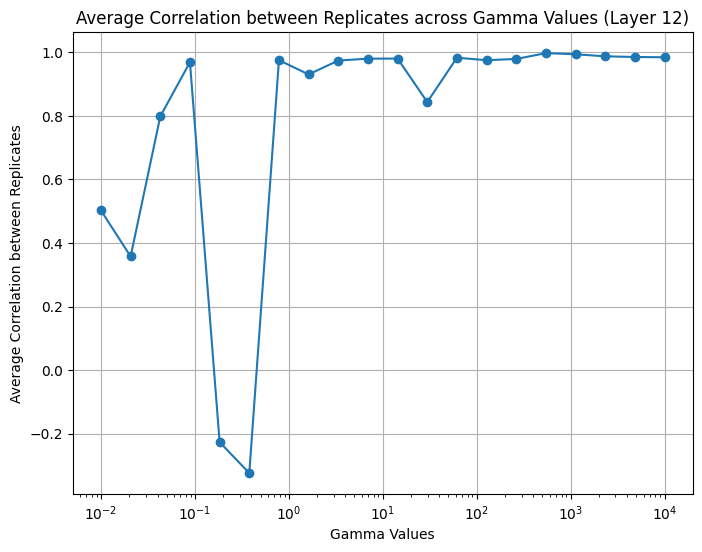

In [9]:
layer_true_sel_coeffs = true_sel_coeffs[12]
layer_s_joint = gamma_data[12][2]
norm_true_sel_coeffs = (layer_true_sel_coeffs - np.mean(layer_true_sel_coeffs)) / np.std(layer_true_sel_coeffs)
layer_corrs = []
for s_joint in layer_s_joint:
    norm_s_joint = (s_joint - np.mean(s_joint)) / np.std(s_joint)
    corr_coeff = np.corrcoef(norm_s_joint, norm_true_sel_coeffs)[0, 1]
    layer_corrs.append(corr_coeff)
gamma_vals = gamma_data[12][0]
plt.figure(figsize=(8, 6))
plt.plot(gamma_vals, layer_corrs, marker='o')
plt.xlabel("Gamma Values")
plt.ylabel("Correlation Coefficient")
plt.title(f"Correlation between s_joint and True Selection Coefficients across Gamma Values (Layer {layer})")
plt.grid()
plt.xscale('log')
plt.savefig(f"correlation_layer_{layer}.png")
plt.show()

# plot the replicate correlations with each other by gamma
rep_sels_by_gamma = gamma_data[12][1]
average_correlations = []
for gamma_idx in range(len(gamma_vals)):
    rep_sels = rep_sels_by_gamma[gamma_idx]
    correlations = []
    for i in range(len(rep_sels)):
        for j in range(i + 1, len(rep_sels)):
            corr_coeff = np.corrcoef(rep_sels[i], rep_sels[j])[0, 1]
            correlations.append(corr_coeff)
    average_correlation = np.mean(correlations)
    average_correlations.append(average_correlation)
            

plt.figure(figsize=(8, 6))
plt.plot(gamma_vals, average_correlations, marker='o')
plt.xlabel("Gamma Values")
plt.ylabel("Average Correlation between Replicates")
plt.title(f"Average Correlation between Replicates across Gamma Values (Layer {layer})")
plt.grid()
plt.xscale('log')
plt.savefig(f"correlation_by_gamma_layer_{layer}.png")
plt.show()



In [12]:
gamma_data[0][1][1][1]

array([ 1.56993823e-02,  1.22484083e-02,  2.31256056e-03,  9.02895850e-03,
        8.63317798e-03,  1.45667648e-02,  2.10442339e-02, -2.17863723e-03,
        1.28072349e-02,  9.25545283e-03,  1.13014484e-02,  9.67613348e-03,
        1.03664215e-02,  5.18733387e-03, -2.75055030e-03,  7.04678931e-03,
        6.56462915e-03,  6.14587104e-03,  6.73900083e-03,  7.20182765e-03,
        1.22525066e-02,  8.07364369e-03,  6.62795270e-03,  8.73291283e-03,
        8.60134917e-03,  5.28443403e-02,  2.66970883e-03,  2.21199139e-03,
        6.12152270e-03,  3.56487691e-03,  8.63963132e-03, -1.15961900e-01,
        3.06992153e-02,  9.66011224e-03,  1.62114464e-02,  4.78675883e-02,
        3.56409887e-03,  8.04694390e-03,  7.55785462e-03, -3.72361760e-03,
        1.01439785e-02, -4.96878671e-03,  1.10328050e-02,  8.04369973e-03,
        9.33176343e-03,  1.50962022e-02,  2.11277966e-03,  6.89571672e-03,
        1.08328791e-02,  1.18518349e-02,  7.71313570e-03,  8.32750819e-03,
        7.86723093e-03,  

## Looking at the eigenvalues of the covariance matrices

Analyzing layer 0...


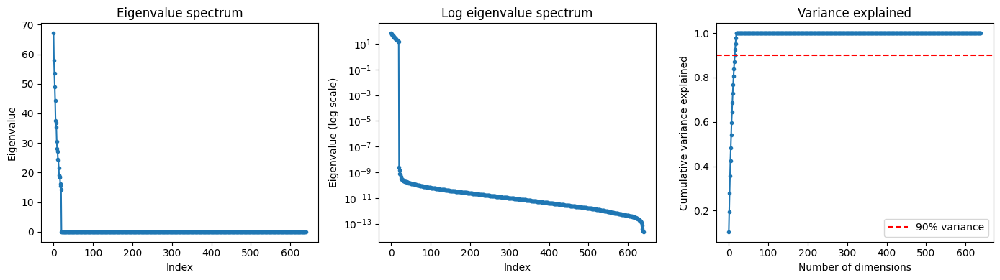

Analyzing layer 1...


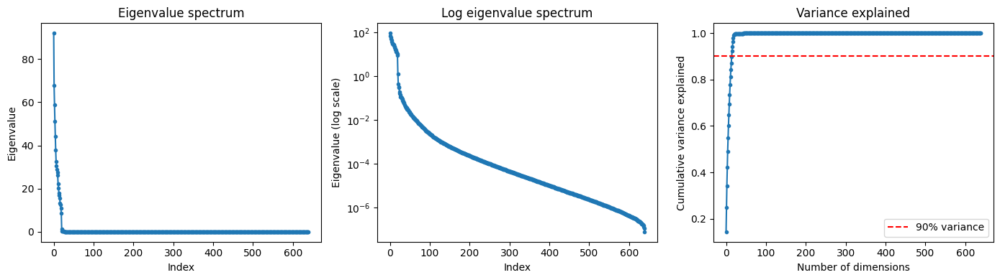

Analyzing layer 2...


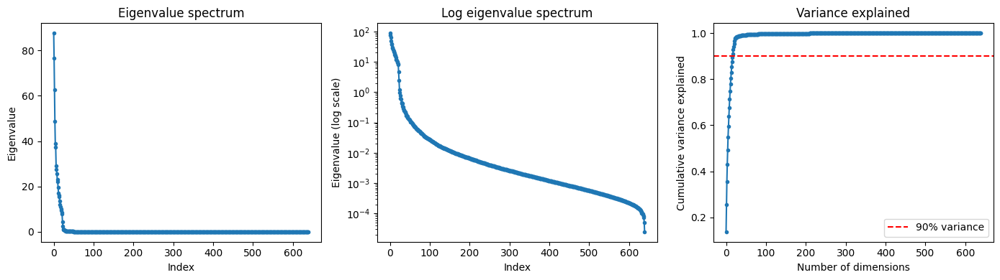

Analyzing layer 3...


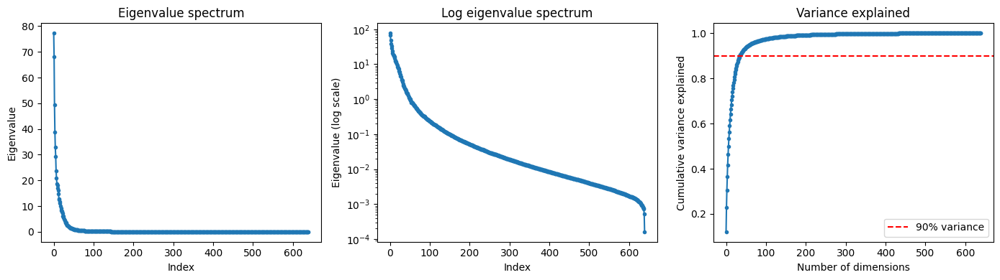

Analyzing layer 4...


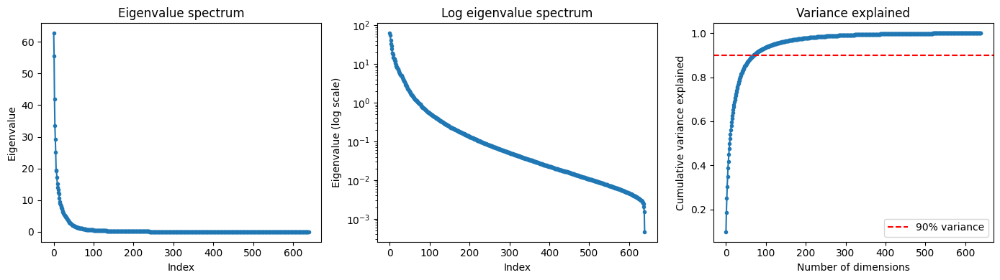

Analyzing layer 5...


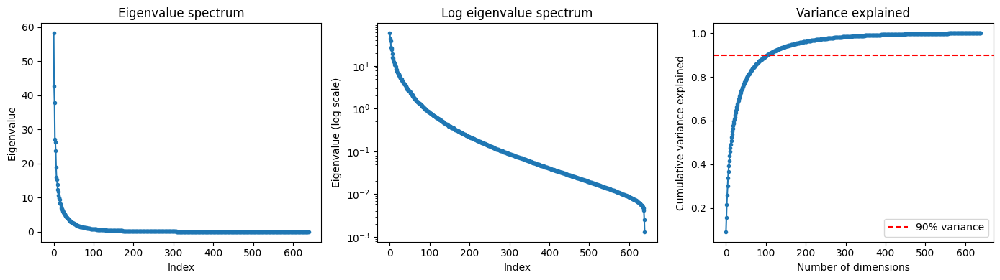

Analyzing layer 6...


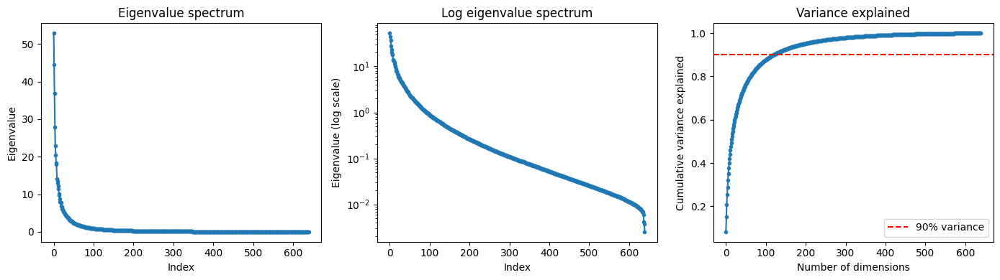

Analyzing layer 7...


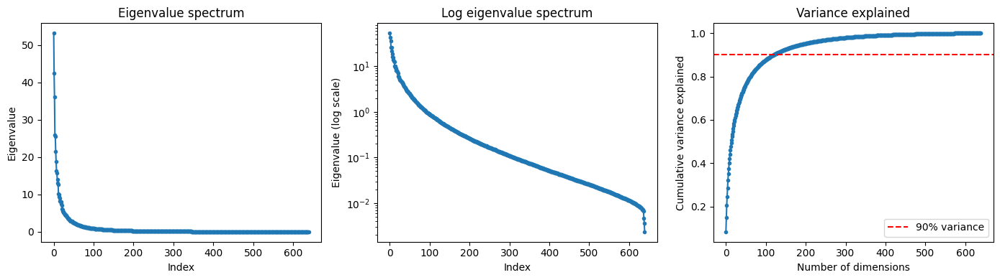

Analyzing layer 8...


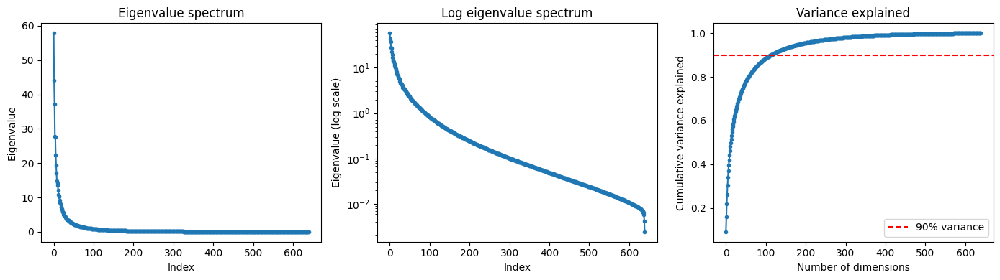

Analyzing layer 9...


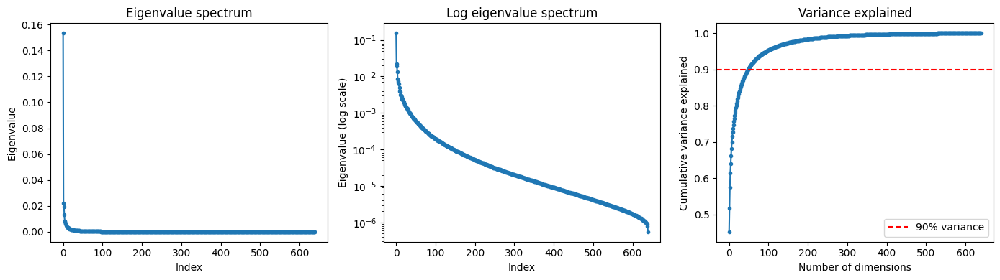

Analyzing layer 10...


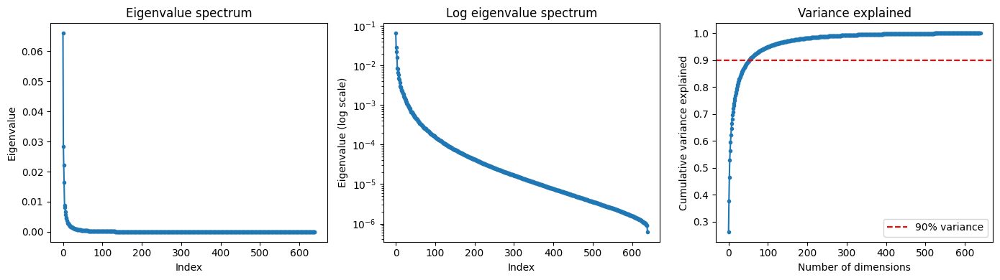

Analyzing layer 11...


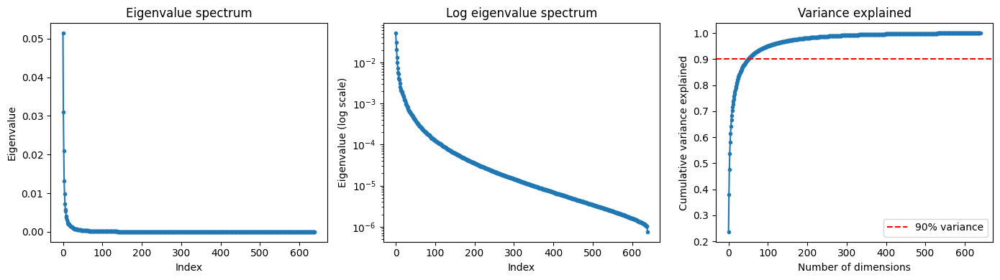

Analyzing layer 12...


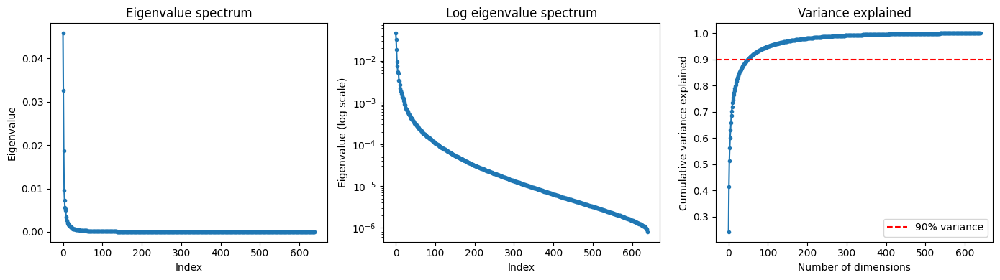

Analyzing layer 13...


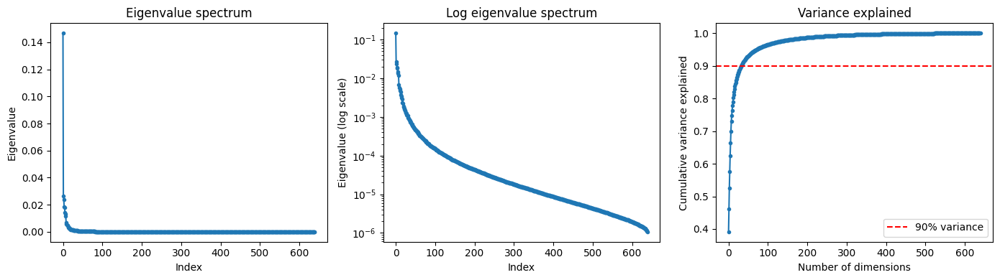

Analyzing layer 14...


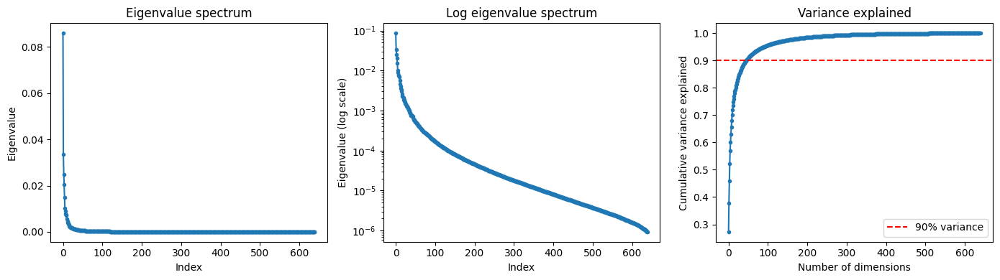

Analyzing layer 15...


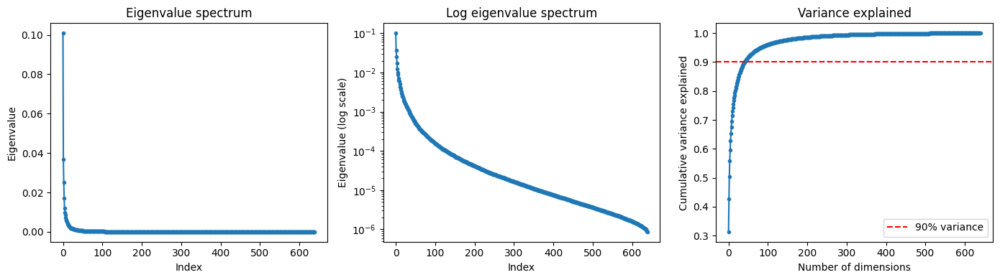

Analyzing layer 16...


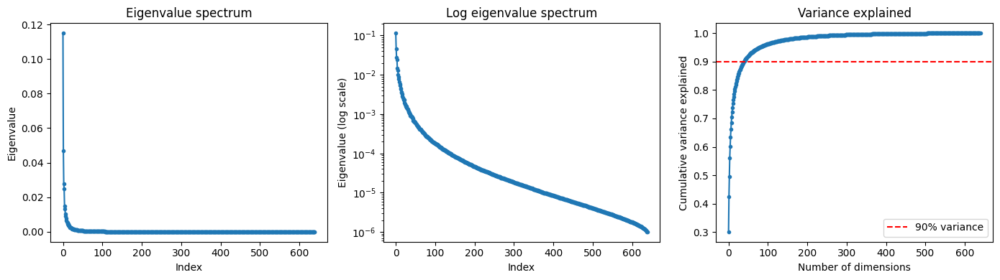

Analyzing layer 17...


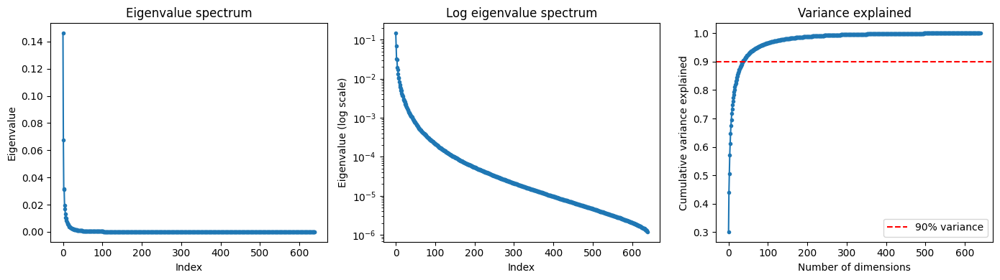

Analyzing layer 18...


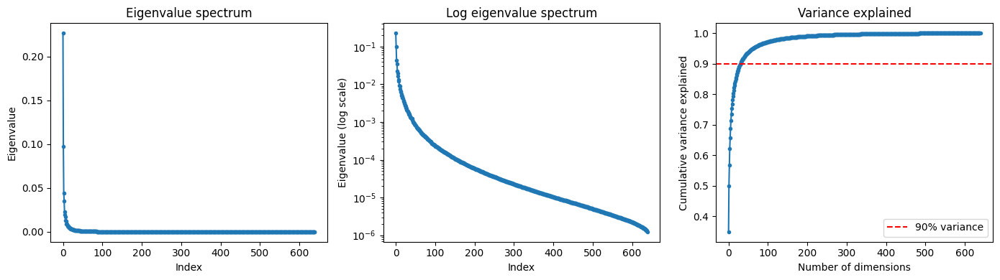

Analyzing layer 19...


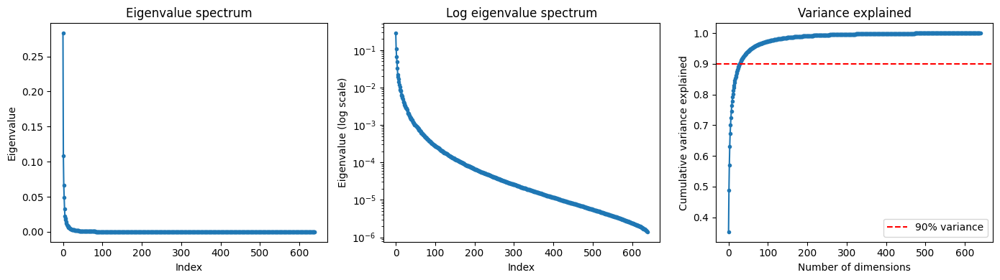

Analyzing layer 20...


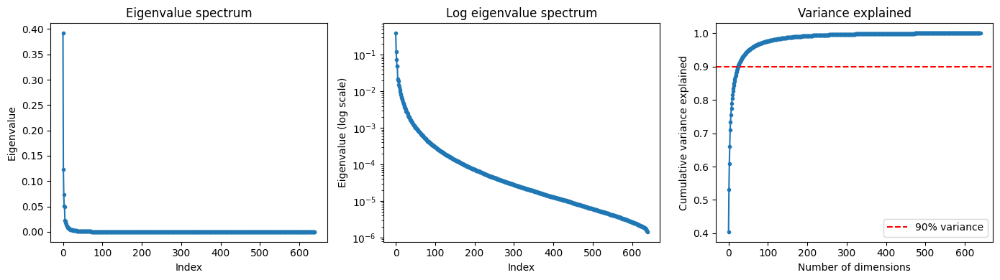

Analyzing layer 21...


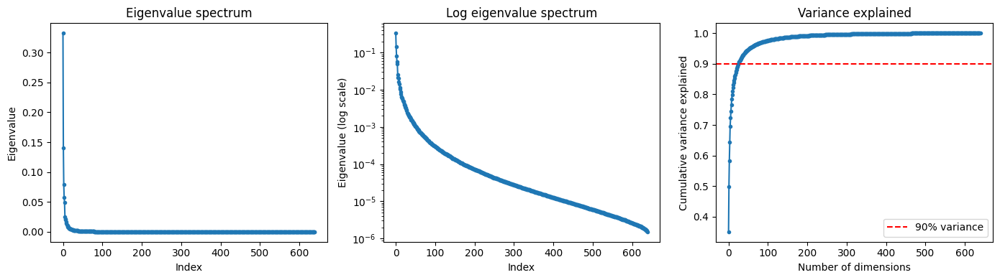

Analyzing layer 22...


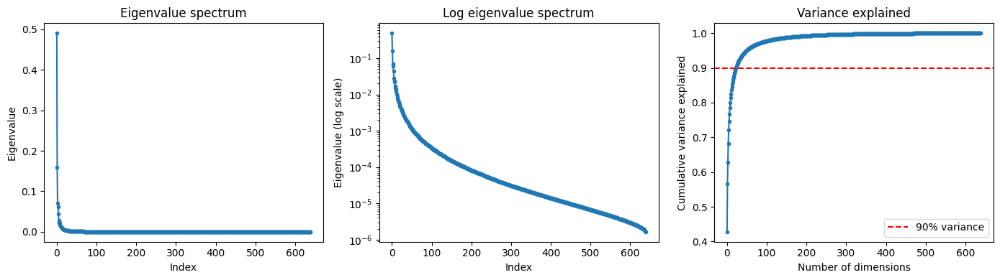

Analyzing layer 23...


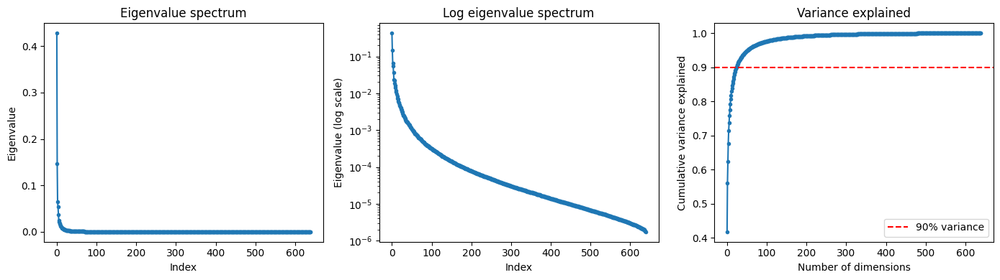

Analyzing layer 24...


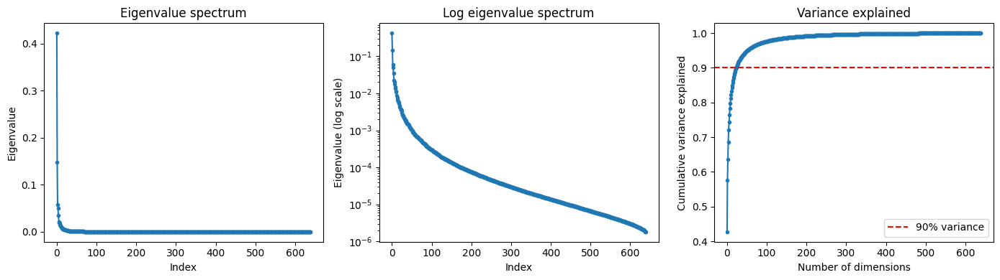

Analyzing layer 25...


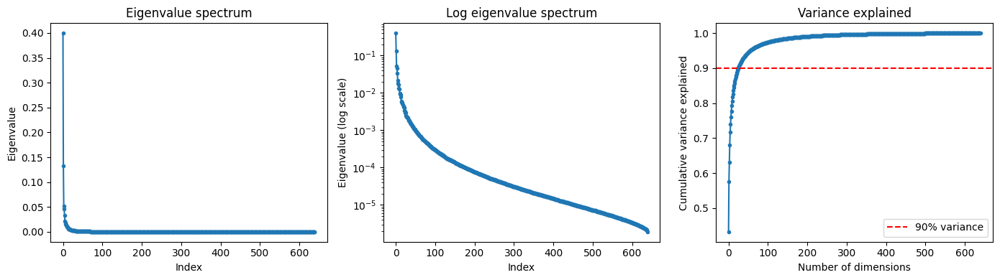

Analyzing layer 26...


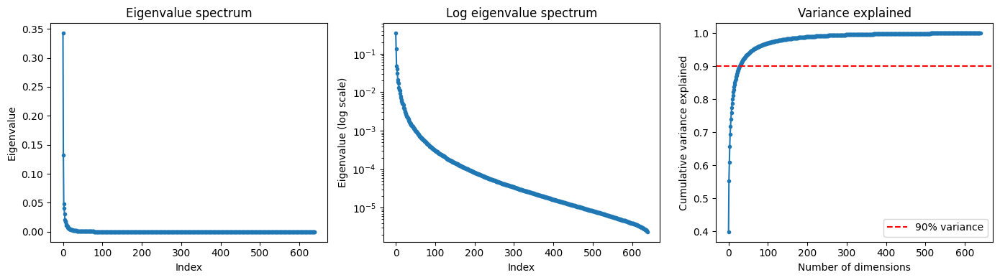

Analyzing layer 27...


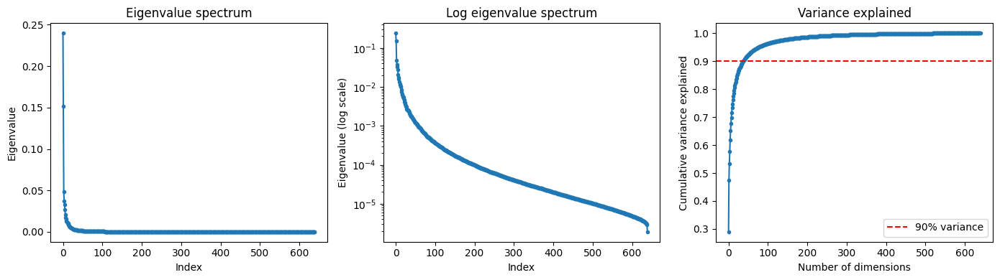

Analyzing layer 28...


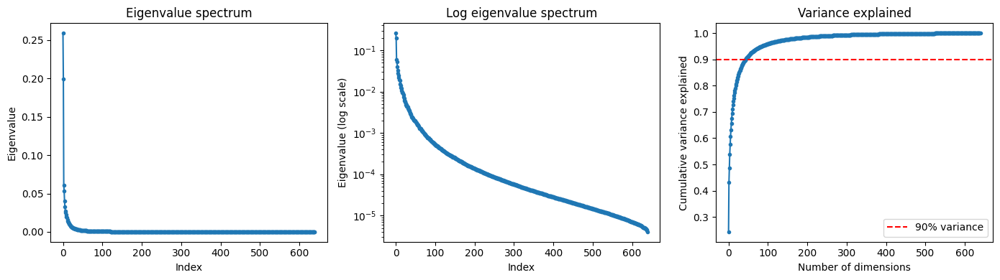

Analyzing layer 29...


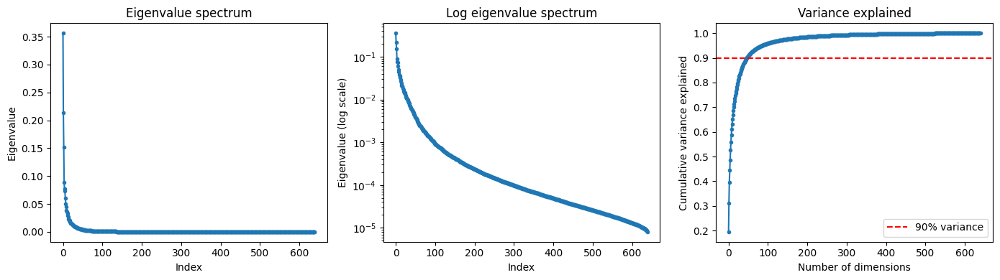

Analyzing layer 30...


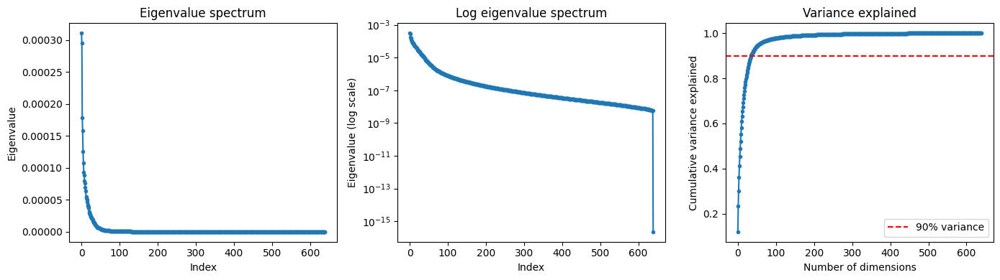

In [3]:
# Load in embeddings

num_layers = 31
for layer in range(num_layers):
    print(f"Analyzing layer {layer}...")
    final_df = load_final_df(layer, bf_path)
    embeddings = np.vstack(final_df['Embedding'].tolist())
    

    # Calculate the covariance of embeddings by layer
    cov = np.cov(embeddings, rowvar=False)
    
    eigenvalues = np.linalg.eigvalsh(cov)  # eigvalsh is faster/more stable for symmetric matrices
    eigenvalues = np.sort(eigenvalues)[::-1]  # sort descending
    
    fig, axes = plt.subplots(1, 3, figsize=(14, 4))

    # 1. Raw eigenvalue spectrum
    axes[0].plot(eigenvalues, 'o-', markersize=3)
    axes[0].set_xlabel('Index')
    axes[0].set_ylabel('Eigenvalue')
    axes[0].set_title('Eigenvalue spectrum')

    # 2. Log scale — reveals structure across orders of magnitude
    axes[1].semilogy(eigenvalues, 'o-', markersize=3)
    axes[1].set_xlabel('Index')
    axes[1].set_ylabel('Eigenvalue (log scale)')
    axes[1].set_title('Log eigenvalue spectrum')

    # 3. Cumulative variance explained
    cum_var = np.cumsum(eigenvalues) / np.sum(eigenvalues)
    axes[2].plot(cum_var, 'o-', markersize=3)
    axes[2].axhline(0.9, color='red', linestyle='--', label='90% variance')
    axes[2].set_xlabel('Number of dimensions')
    axes[2].set_ylabel('Cumulative variance explained')
    axes[2].set_title('Variance explained')
    axes[2].legend()

    plt.tight_layout()
    plt.show()
    
    
    

Analyzing layer 0...


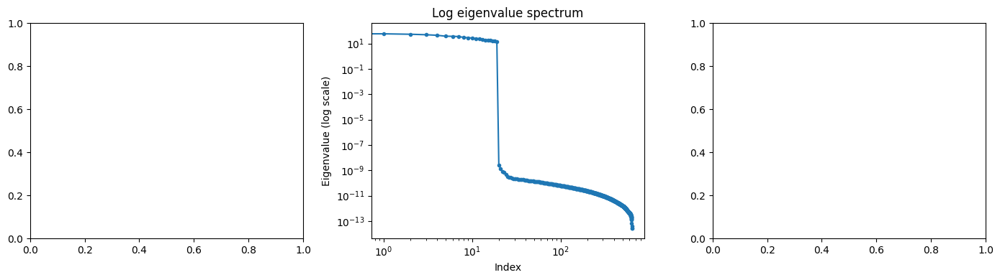

Analyzing layer 1...


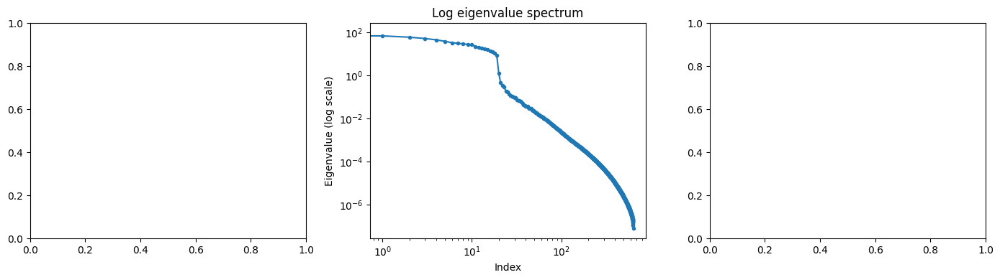

Analyzing layer 2...


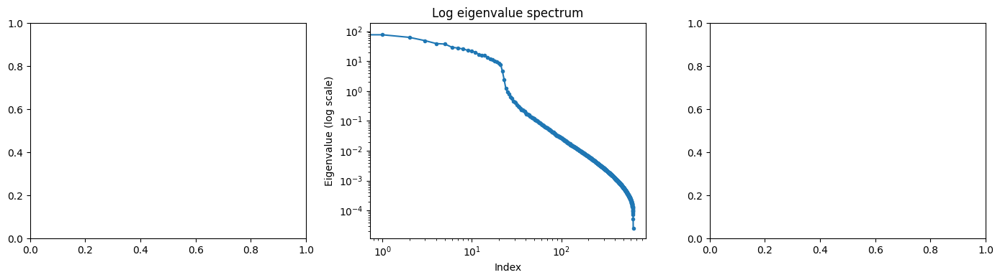

Analyzing layer 3...


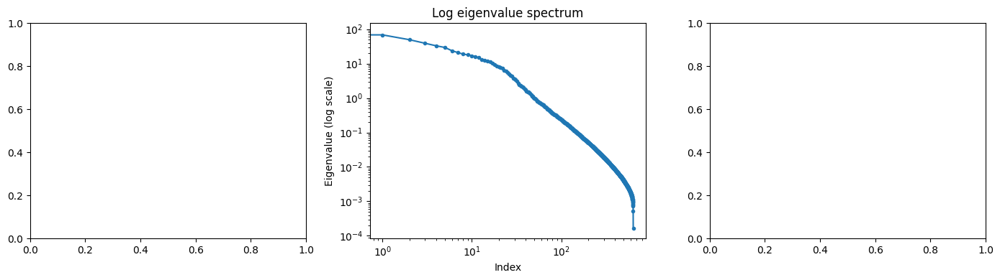

Analyzing layer 4...


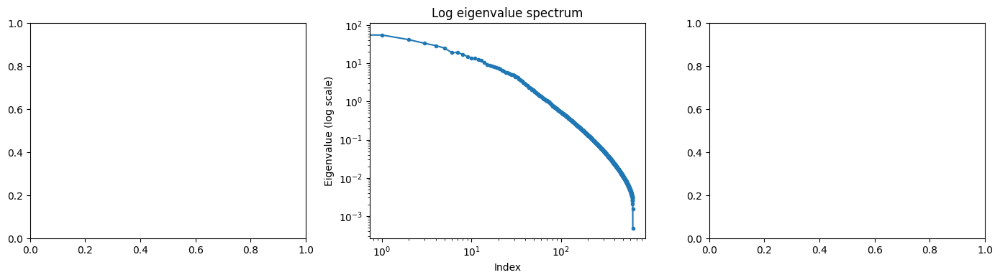

Analyzing layer 5...


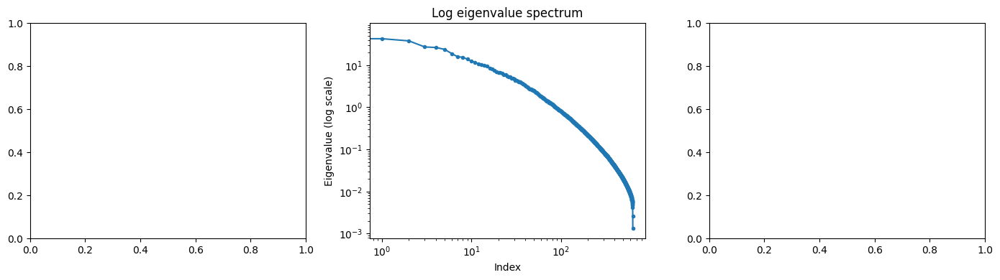

Analyzing layer 6...


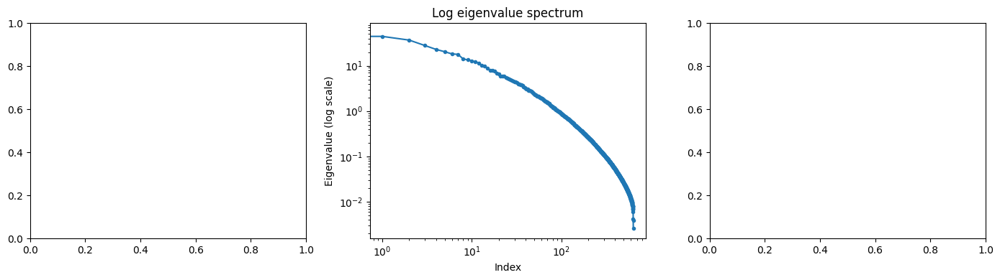

Analyzing layer 7...


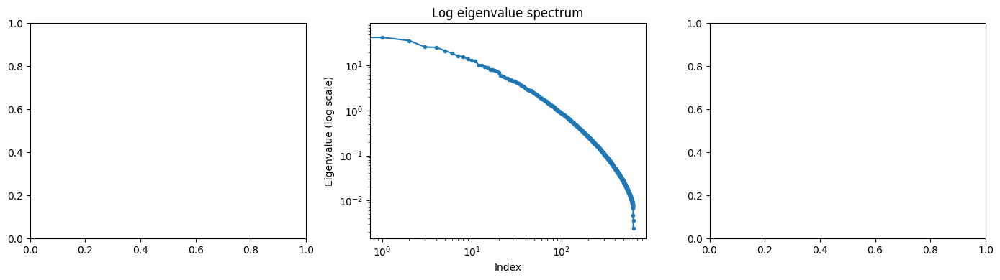

Analyzing layer 8...


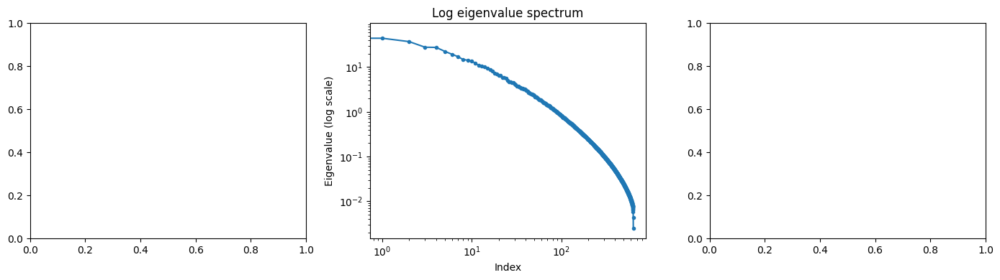

Analyzing layer 9...


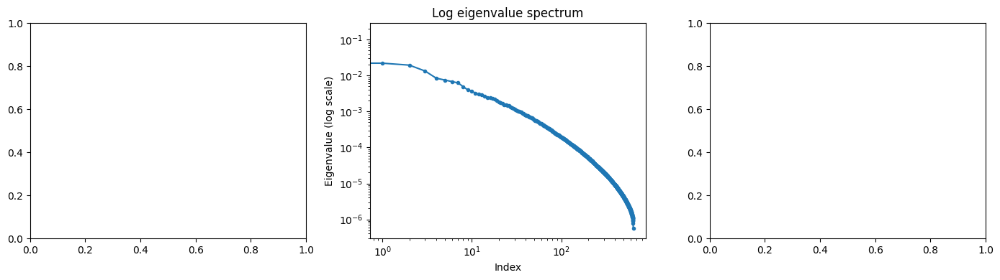

Analyzing layer 10...


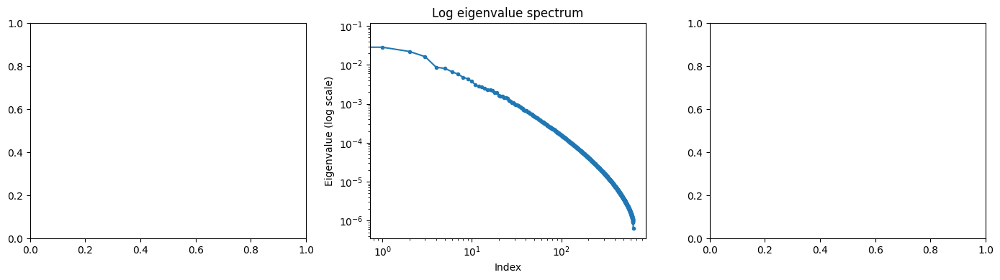

Analyzing layer 11...


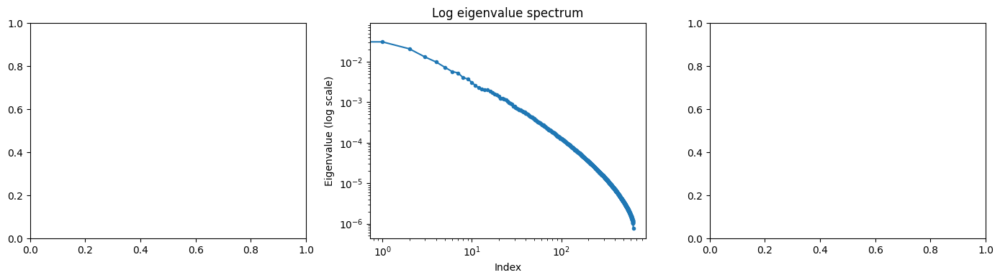

Analyzing layer 12...


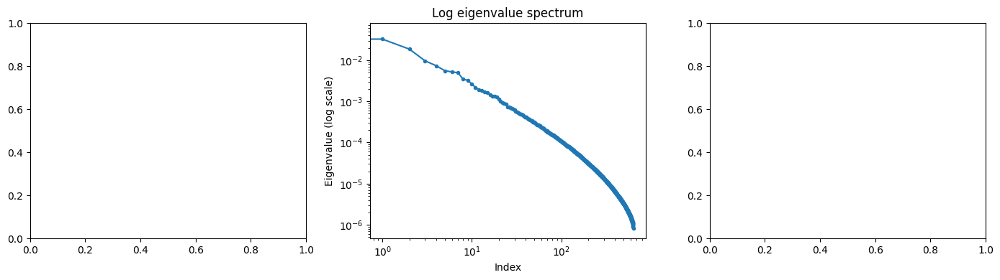

Analyzing layer 13...


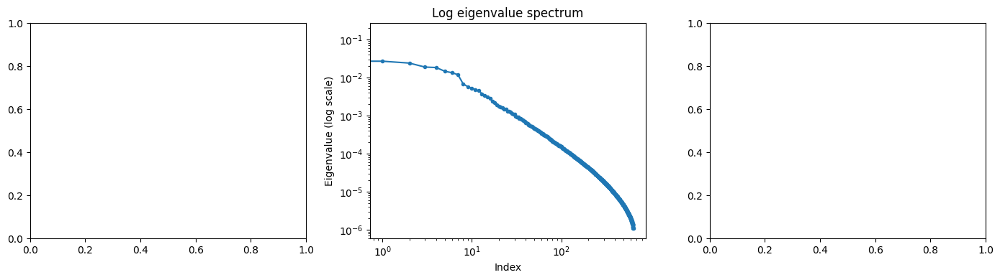

Analyzing layer 14...


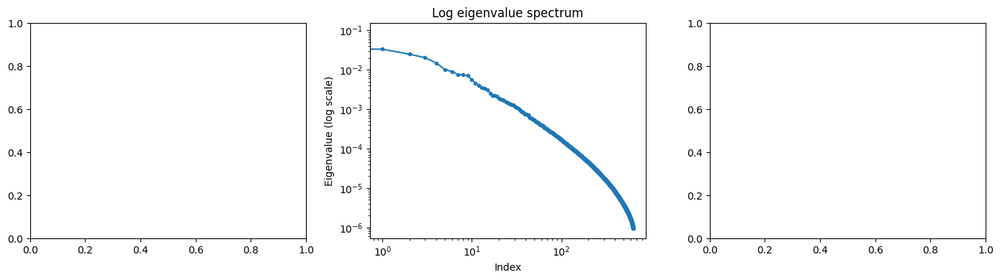

Analyzing layer 15...


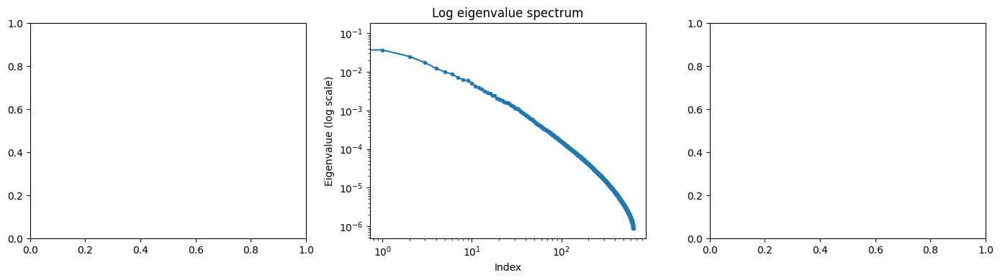

Analyzing layer 16...


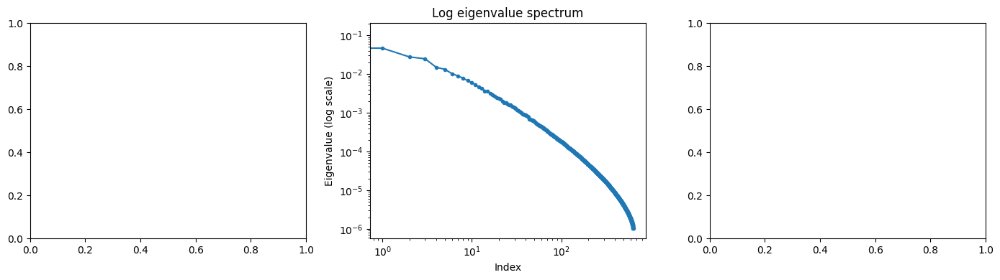

Analyzing layer 17...


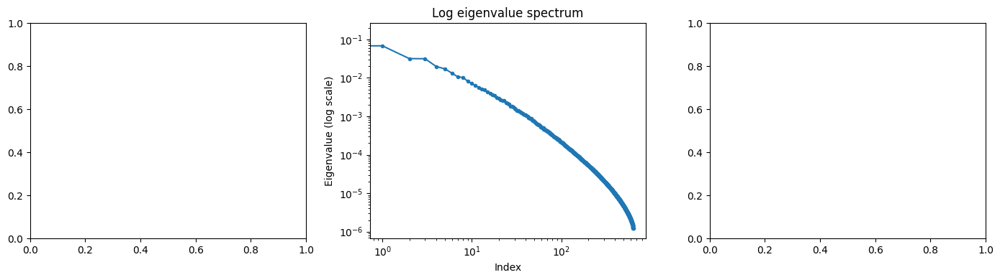

Analyzing layer 18...


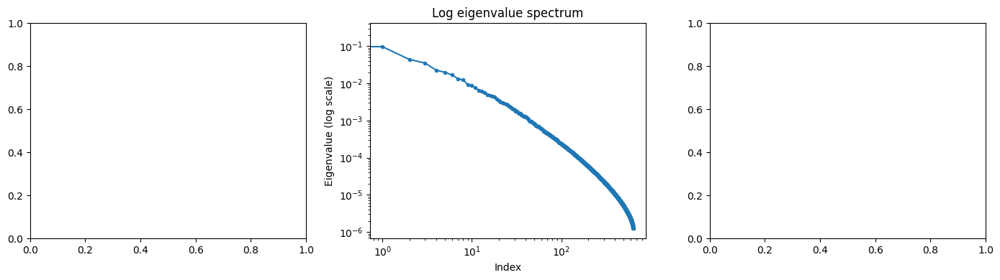

Analyzing layer 19...


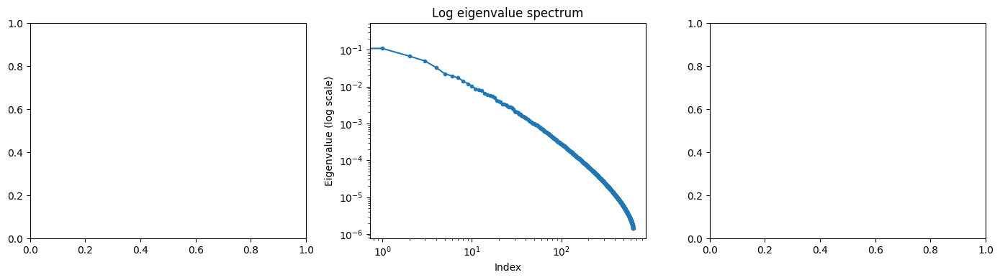

Analyzing layer 20...


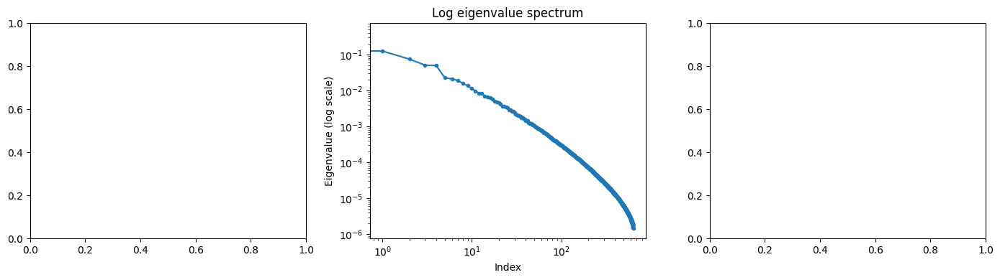

Analyzing layer 21...


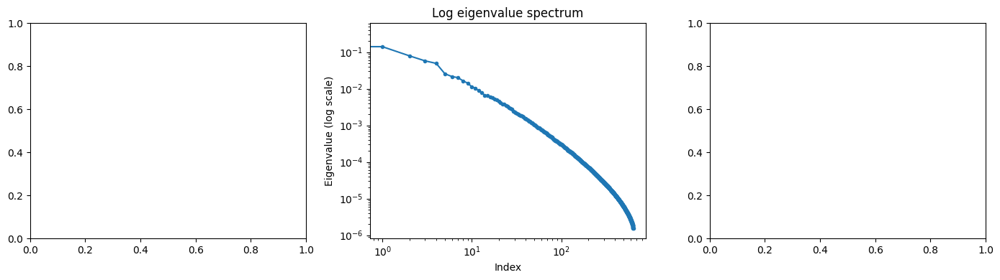

Analyzing layer 22...


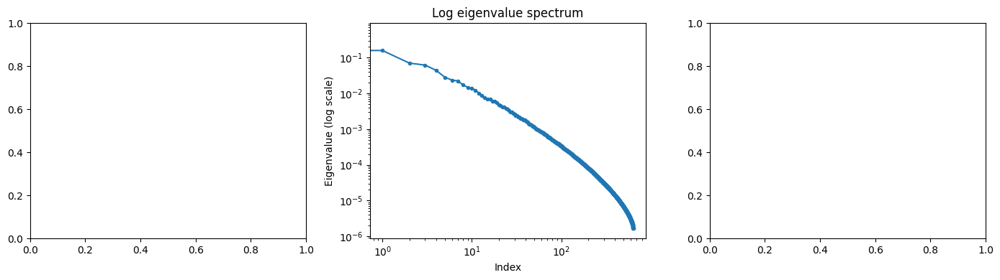

Analyzing layer 23...


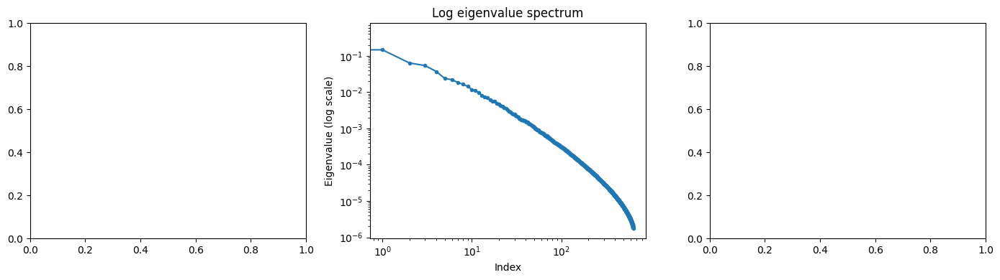

Analyzing layer 24...


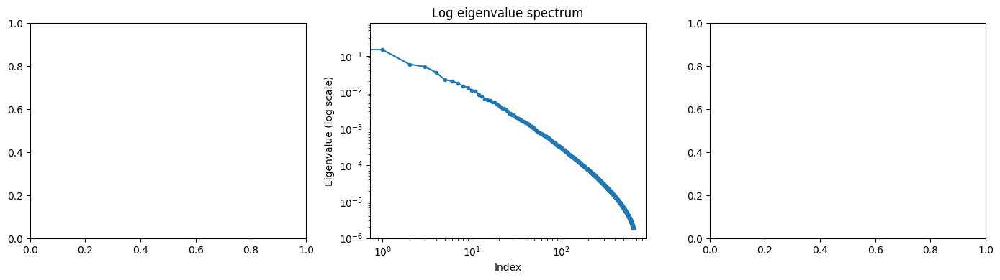

Analyzing layer 25...


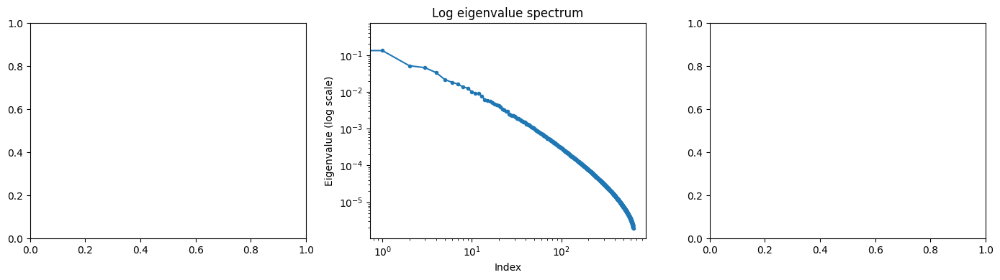

Analyzing layer 26...


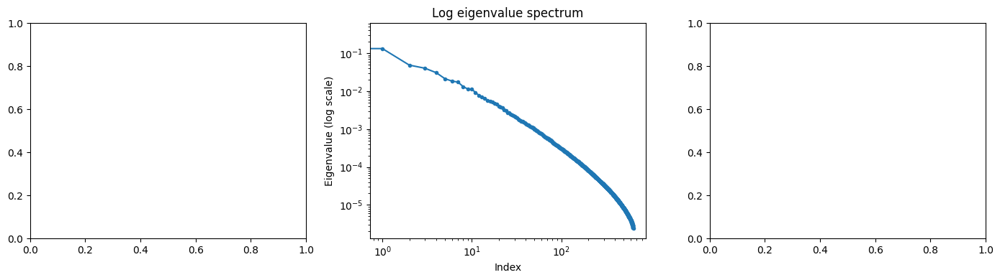

Analyzing layer 27...


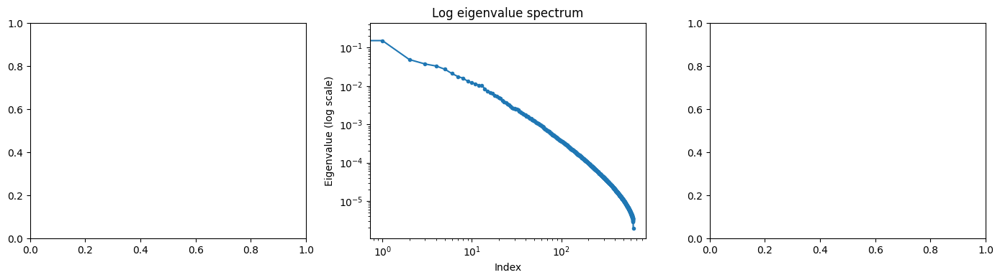

Analyzing layer 28...


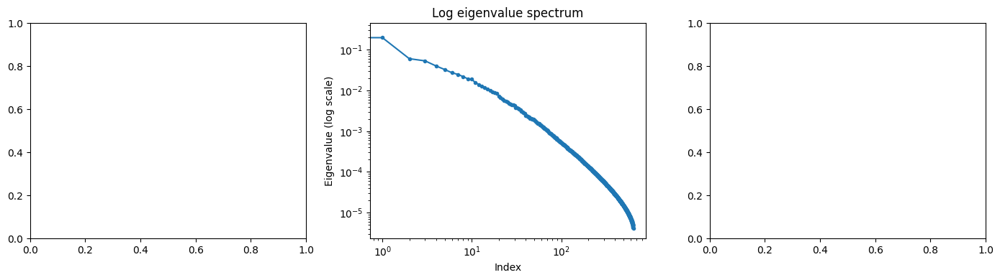

Analyzing layer 29...


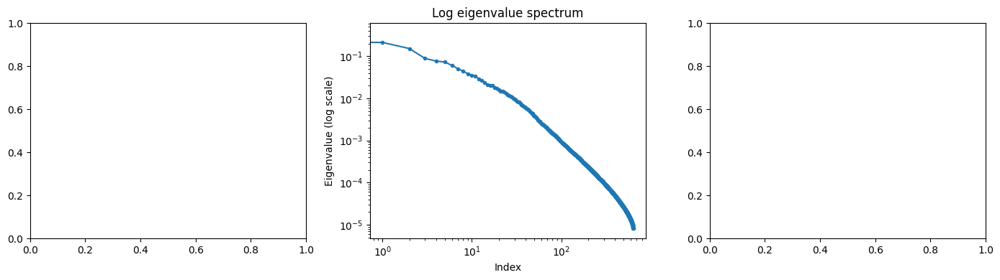

Analyzing layer 30...


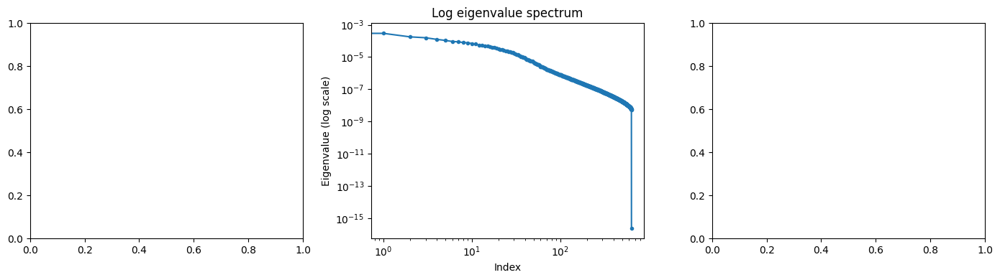

In [3]:
# Load in embeddings

num_layers = 31
for layer in range(num_layers):
    print(f"Analyzing layer {layer}...")
    final_df = load_final_df(layer, bf_path)
    embeddings = np.vstack(final_df['Embedding'].tolist())
    

    # Calculate the covariance of embeddings by layer
    cov = np.cov(embeddings, rowvar=False)
    
    eigenvalues = np.linalg.eigvalsh(cov)  # eigvalsh is faster/more stable for symmetric matrices
    eigenvalues = np.sort(eigenvalues)[::-1]  # sort descending
    
    fig, axes = plt.subplots(1, 3, figsize=(14, 4))


    # 2. Log scale — reveals structure across orders of magnitude
    axes[1].semilogy(eigenvalues, 'o-', markersize=3)
    axes[1].set_xlabel('Index')

    axes[1].set_ylabel('Eigenvalue (log scale)')
    axes[1].set_title('Log eigenvalue spectrum')
    # set x log
    axes[1].set_xscale('log')

    plt.tight_layout()
    plt.show()
    
    
    

In [8]:
def get_random_cov_mat(embedding_dims=128, num_samples=1000):
    # Generate random embeddins, each value with mean 0 and std 1
    random_embeddings = np.random.randn(num_samples, embedding_dims)
    # Calculate covariance matrix
    cov = np.cov(random_embeddings, rowvar=False)
    return cov

Analyzing layer 0...


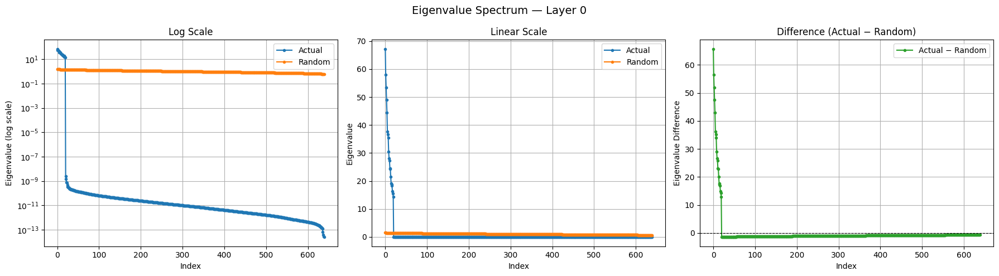

Analyzing layer 1...


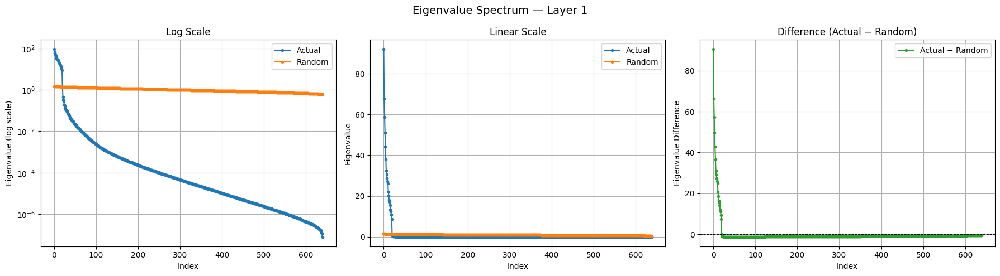

Analyzing layer 2...


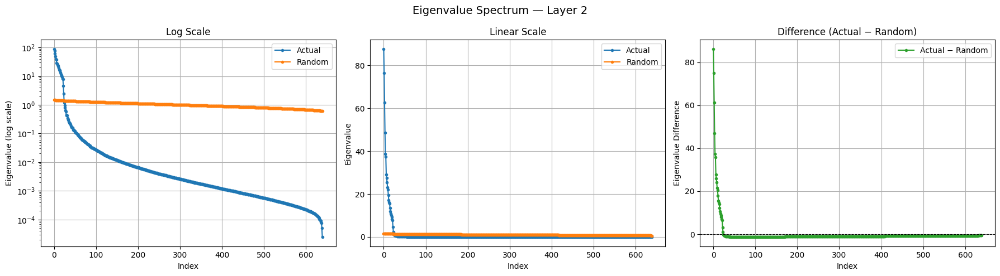

Analyzing layer 3...


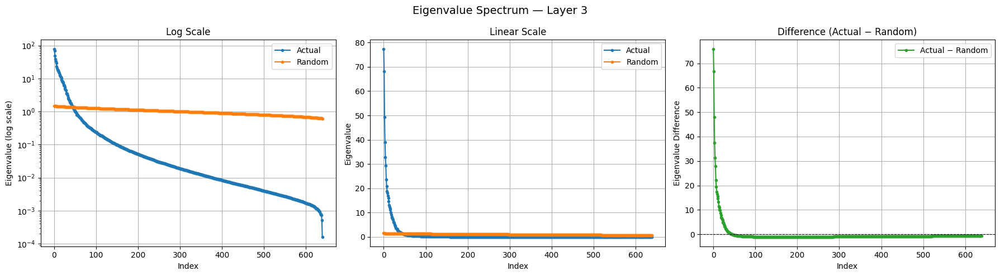

Analyzing layer 4...


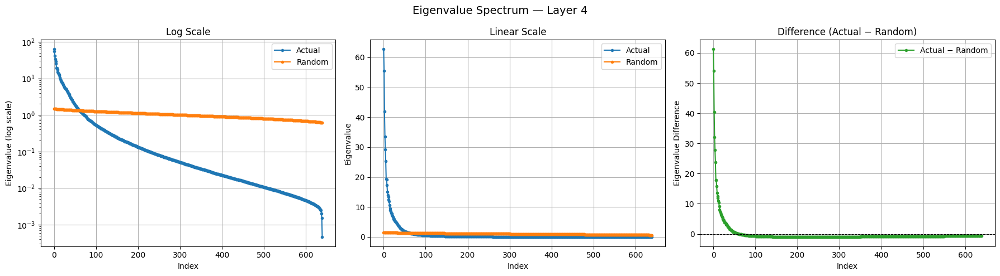

Analyzing layer 5...


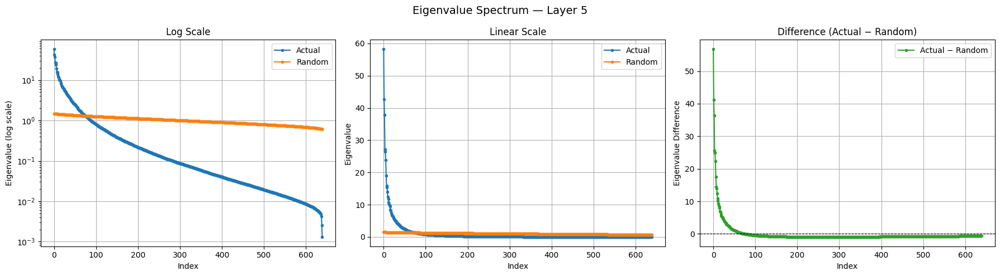

Analyzing layer 6...


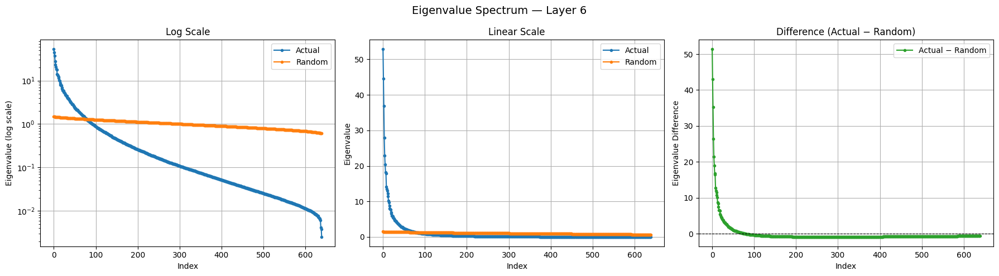

Analyzing layer 7...


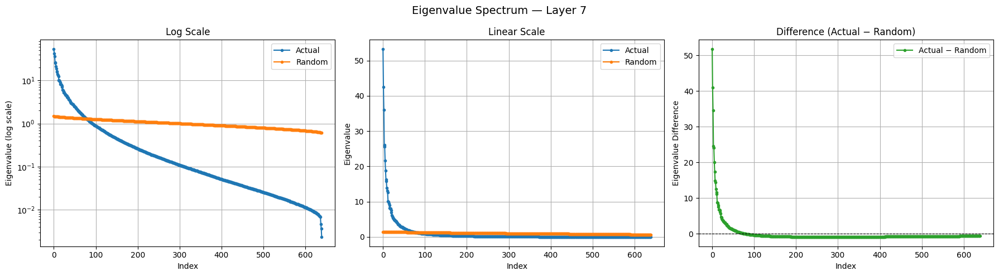

Analyzing layer 8...


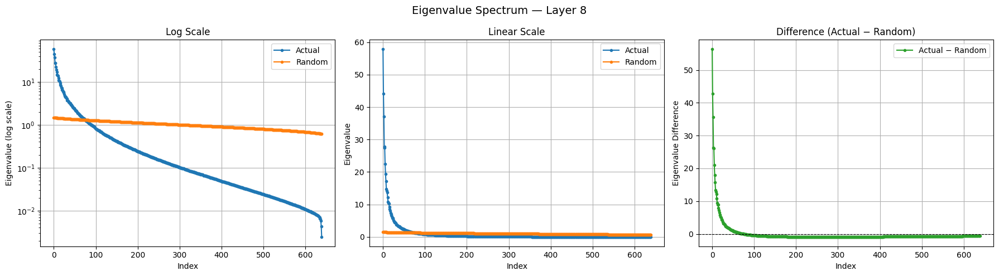

Analyzing layer 9...


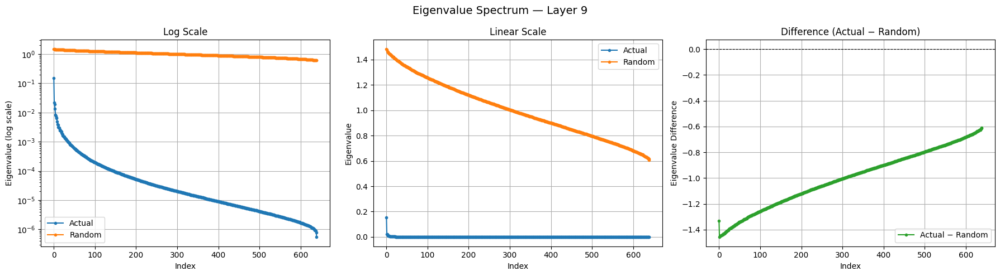

Analyzing layer 10...


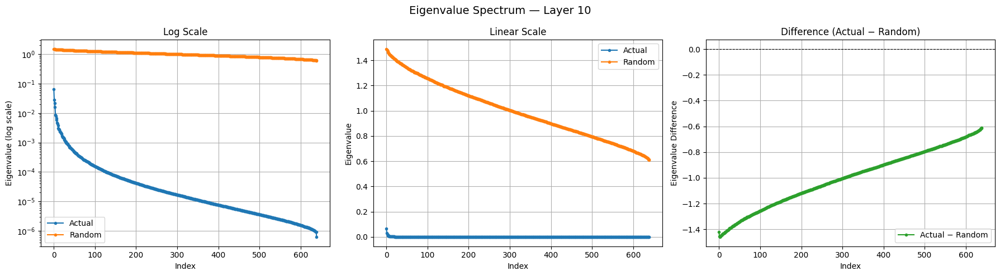

Analyzing layer 11...


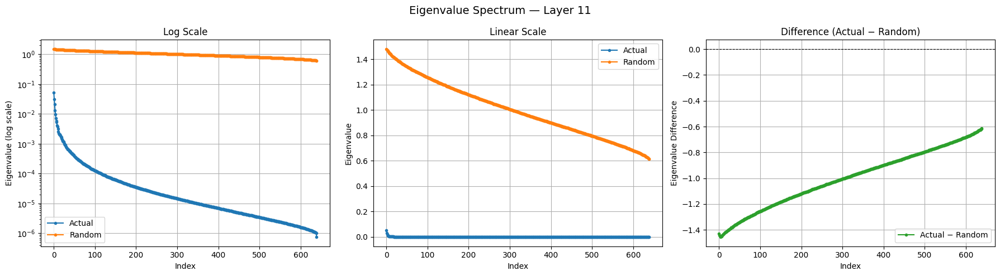

Analyzing layer 12...


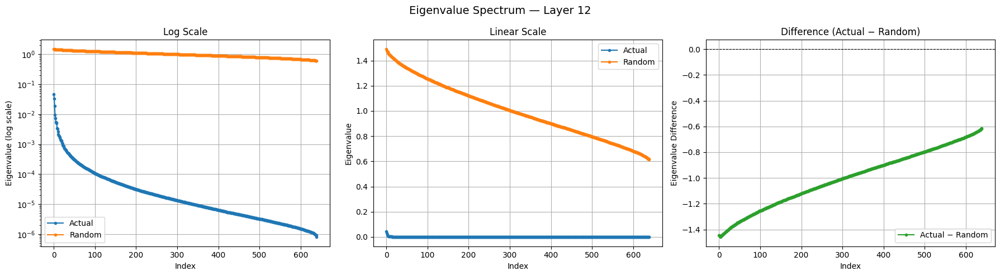

Analyzing layer 13...


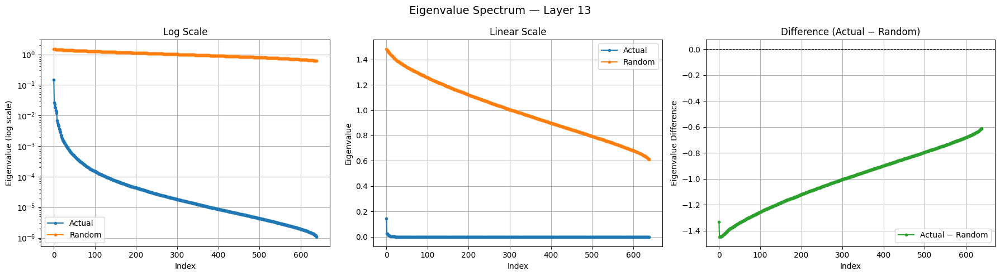

Analyzing layer 14...


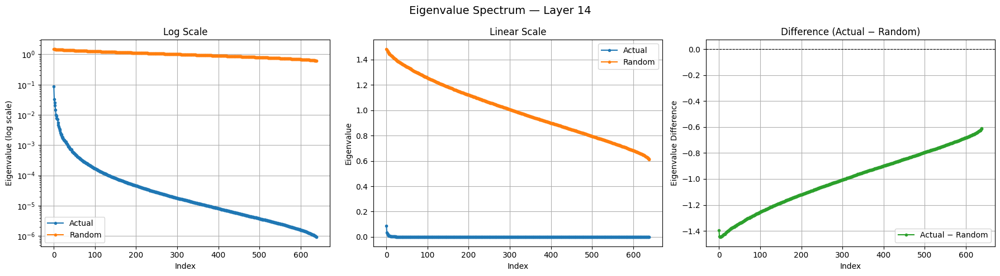

Analyzing layer 15...


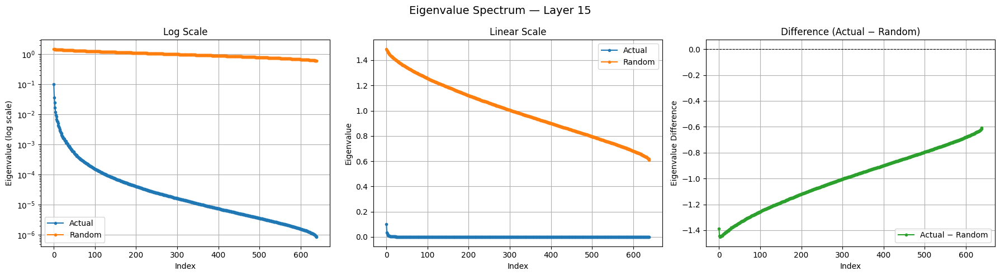

Analyzing layer 16...


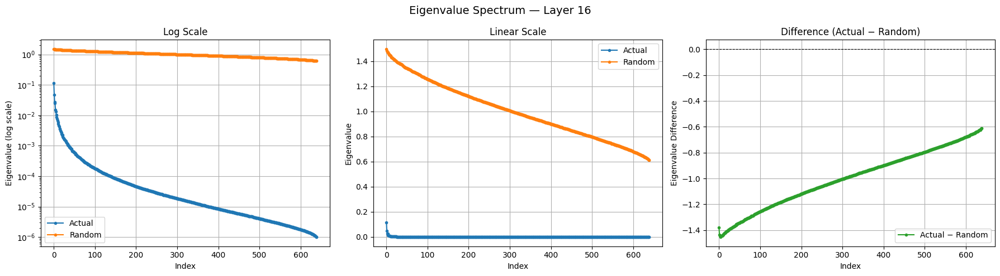

Analyzing layer 17...


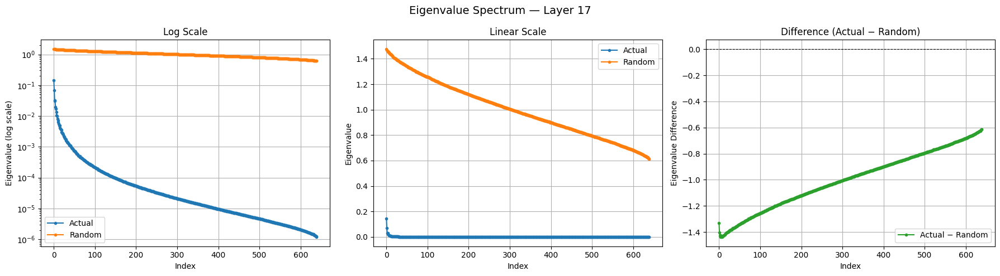

Analyzing layer 18...


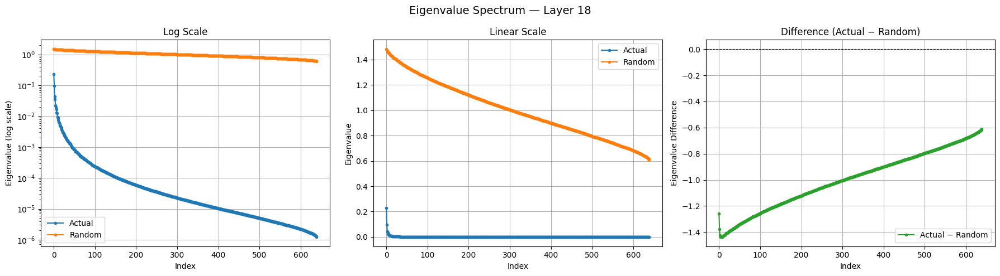

Analyzing layer 19...


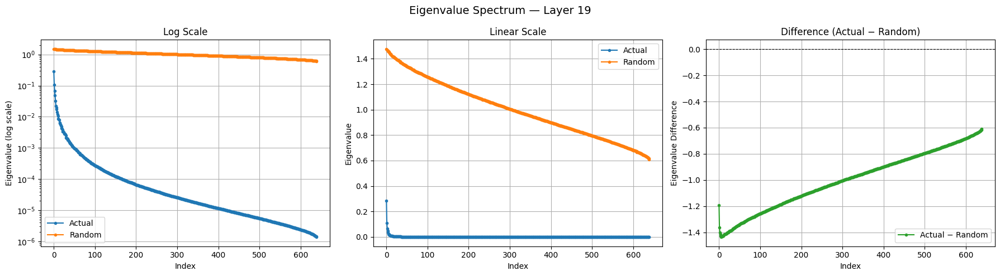

Analyzing layer 20...


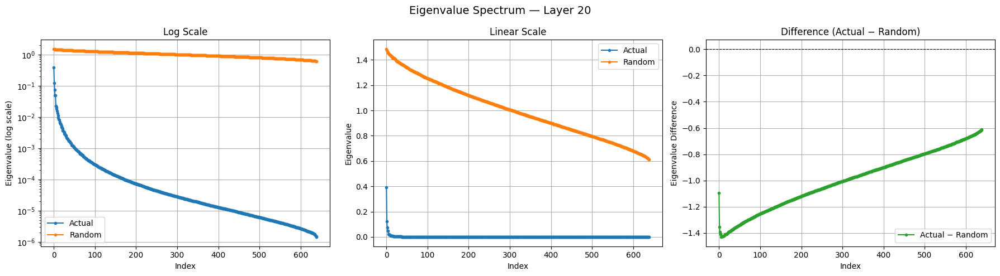

Analyzing layer 21...


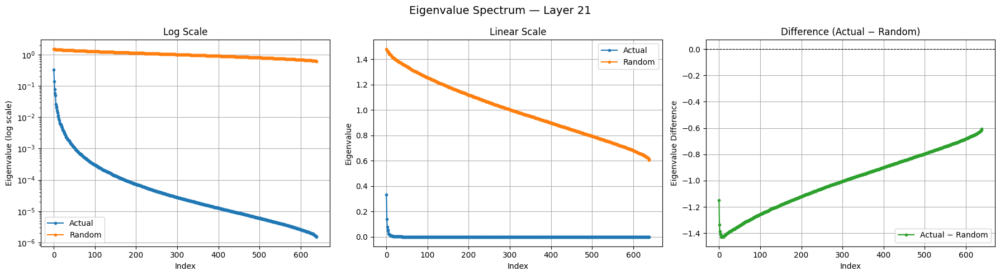

Analyzing layer 22...


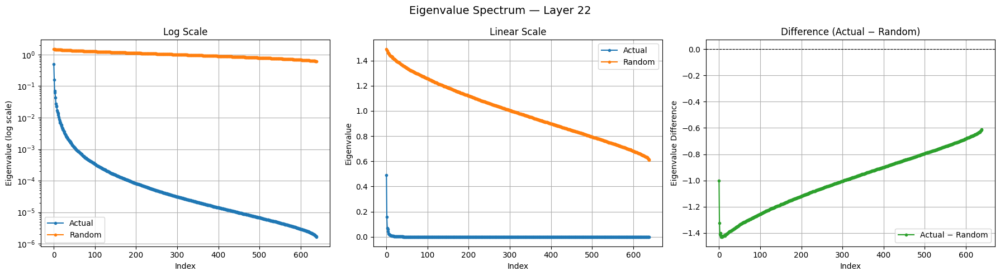

Analyzing layer 23...


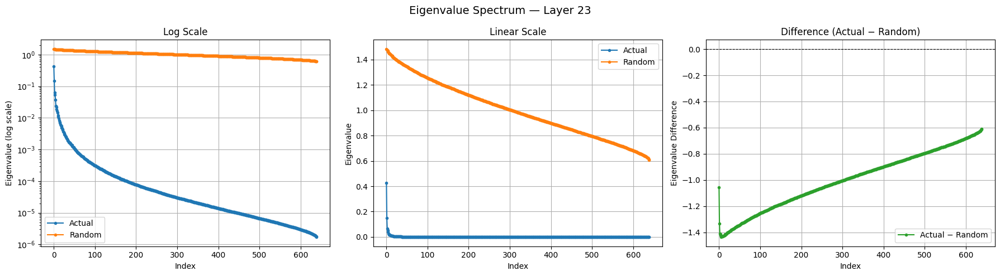

Analyzing layer 24...


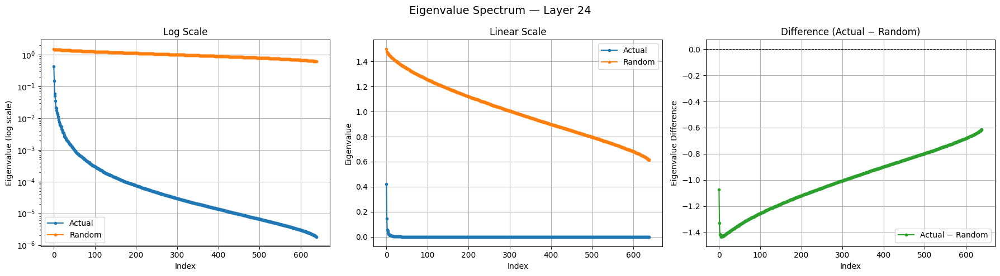

Analyzing layer 25...


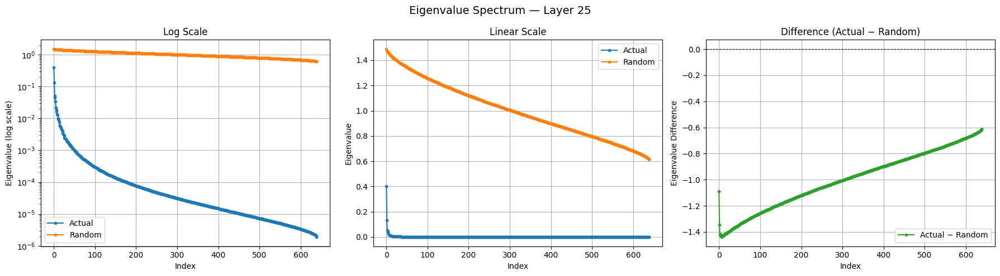

Analyzing layer 26...


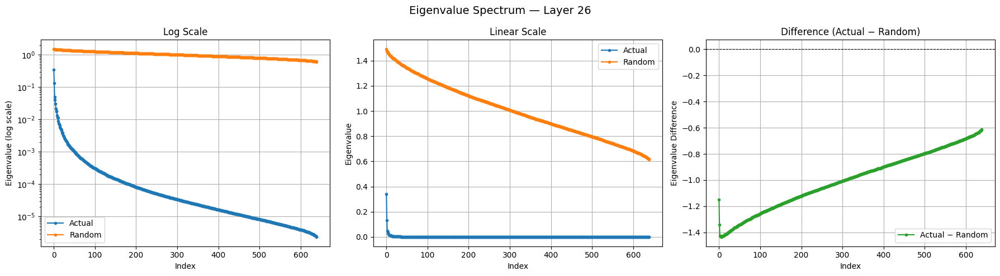

Analyzing layer 27...


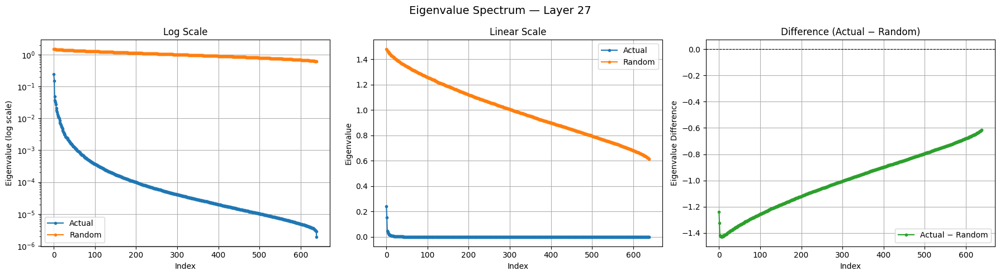

Analyzing layer 28...


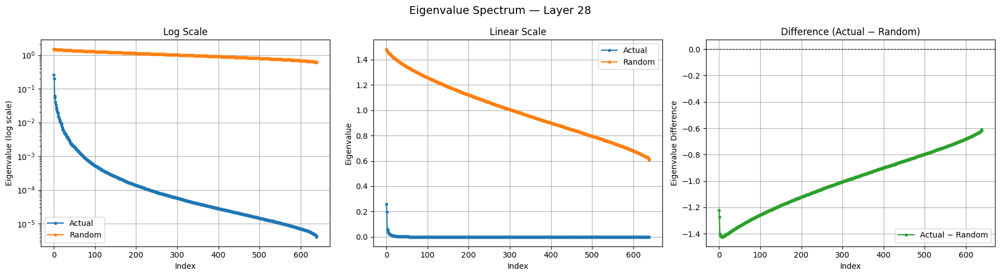

Analyzing layer 29...


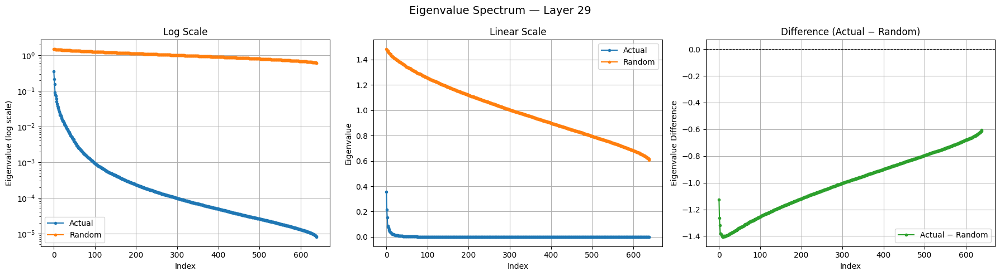

Analyzing layer 30...


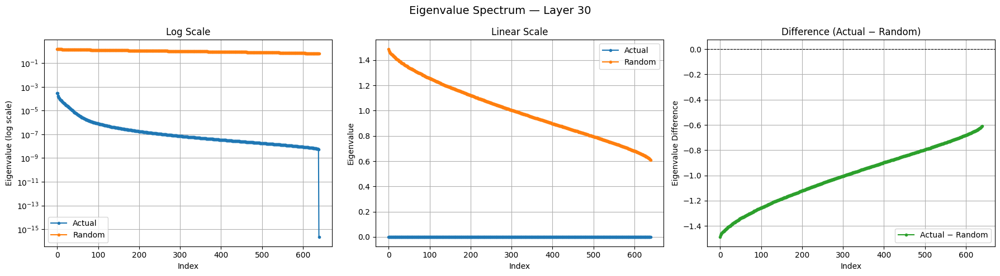

In [11]:
num_layers = 31
for layer in range(num_layers):
    print(f"Analyzing layer {layer}...")
    final_df = load_final_df(layer, bf_path)
    embeddings = np.vstack(final_df['Embedding'].tolist())

    # Calculate the covariance of embeddings by layer
    cov = np.cov(embeddings, rowvar=False)
    eigenvalues = np.linalg.eigvalsh(cov)
    eigenvalues = np.sort(eigenvalues)[::-1]

    # Get the random covariance eigenvalues for the same number of samples and dimensions
    num_samples, num_dims = embeddings.shape
    rand_cov = get_random_cov_mat(num_dims, num_samples)
    rand_eigenvalues = np.linalg.eigvalsh(rand_cov)
    rand_eigenvalues = np.sort(rand_eigenvalues)[::-1]

    diff = eigenvalues - rand_eigenvalues

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(f'Eigenvalue Spectrum — Layer {layer}', fontsize=14)

    # --- Plot 1: Log scale ---
    ax = axes[0]
    ax.plot(eigenvalues, 'o-', markersize=3, label='Actual')
    ax.plot(rand_eigenvalues, 'o-', markersize=3, label='Random')
    ax.set_xlabel('Index')
    ax.set_ylabel('Eigenvalue (log scale)')
    ax.set_title('Log Scale')
    ax.set_yscale('log')
    ax.legend()
    ax.grid()

    # --- Plot 2: Linear scale ---
    ax = axes[1]
    ax.plot(eigenvalues, 'o-', markersize=3, label='Actual')
    ax.plot(rand_eigenvalues, 'o-', markersize=3, label='Random')
    ax.set_xlabel('Index')
    ax.set_ylabel('Eigenvalue')
    ax.set_title('Linear Scale')
    ax.legend()
    ax.grid()

    # --- Plot 3: Difference ---
    ax = axes[2]
    ax.plot(diff, 'o-', markersize=3, color='tab:green', label='Actual − Random')
    ax.axhline(0, color='k', linewidth=0.8, linestyle='--')
    ax.set_xlabel('Index')
    ax.set_ylabel('Eigenvalue Difference')
    ax.set_title('Difference (Actual − Random)')
    ax.legend()
    ax.grid()

    plt.tight_layout()
    plt.show()

In [ ]:
num_layers = 31
dims_90 = []

for layer in range(num_layers):
    print(f"Analyzing layer {layer}...")
    final_df = load_final_df(layer, bf_path)
    embeddings = np.vstack(final_df['Embedding'].tolist())

    cov = np.cov(embeddings, rowvar=False)
    eigenvalues = np.linalg.eigvalsh(cov)
    eigenvalues = np.sort(eigenvalues)[::-1]

    cumvar = np.cumsum(eigenvalues) / np.sum(eigenvalues)
    n_dims = int(np.searchsorted(cumvar, 0.90) + 1)
    dims_90.append(n_dims)

fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(range(num_layers), dims_90, 'o-', markersize=5, color='tab:blue')
ax.set_xlabel('Layer')
ax.set_ylabel('Dimensions to reach 90% variance')
ax.set_title('Intrinsic Dimensionality by Layer (90% variance threshold)')
ax.grid()
plt.tight_layout()
plt.show()

In [3]:
def get_random_cov_mat(embedding_dims=128, num_samples=1000):
    # Generate random embeddins, each value with mean 0 and std 1
    random_embeddings = np.random.randn(num_samples, embedding_dims)
    # Calculate covariance matrix
    cov = np.cov(random_embeddings, rowvar=False)
    return cov

In [4]:
def plot_eigenvalue_spectrum(final_df, layer=None):
    """
    Plot log, linear, and difference eigenvalue spectra for a given embedding dataframe.
    
    Parameters
    ----------
    final_df : pd.DataFrame
        DataFrame with an 'Embedding' column containing embedding vectors.
    layer : int or None
        Layer index used only for the plot title.
    """
    embeddings = np.vstack(final_df['Embedding'].tolist())

    cov = np.cov(embeddings, rowvar=False)
    eigenvalues = np.linalg.eigvalsh(cov)
    eigenvalues = np.sort(eigenvalues)[::-1]

    num_samples, num_dims = embeddings.shape
    rand_cov = get_random_cov_mat(num_dims, num_samples)
    rand_eigenvalues = np.linalg.eigvalsh(rand_cov)
    rand_eigenvalues = np.sort(rand_eigenvalues)[::-1]

    diff = eigenvalues - rand_eigenvalues

    title = f'Eigenvalue Spectrum — Layer {layer}' if layer is not None else 'Eigenvalue Spectrum'
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(title, fontsize=14)

    ax = axes[0]
    ax.plot(eigenvalues, 'o-', markersize=3, label='Actual')
    ax.plot(rand_eigenvalues, 'o-', markersize=3, label='Random')
    ax.set_xlabel('Index')
    ax.set_ylabel('Eigenvalue (log scale)')
    ax.set_title('Log Scale')
    ax.set_yscale('log')
    ax.legend()
    ax.grid()

    ax = axes[1]
    ax.plot(eigenvalues, 'o-', markersize=3, label='Actual')
    ax.plot(rand_eigenvalues, 'o-', markersize=3, label='Random')
    ax.set_xlabel('Index')
    ax.set_ylabel('Eigenvalue')
    ax.set_title('Linear Scale')
    ax.legend()
    ax.grid()

    ax = axes[2]
    ax.plot(diff, 'o-', markersize=3, color='tab:green', label='Actual − Random')
    ax.axhline(0, color='k', linewidth=0.8, linestyle='--')
    ax.set_xlabel('Index')
    ax.set_ylabel('Eigenvalue Difference')
    ax.set_title('Difference (Actual − Random)')
    ax.legend()
    ax.grid()

    plt.tight_layout()
    plt.show()


In [10]:
def plot_intrinsic_dimensionality(num_layers, path, threshold=0.90):
    """
    Plot intrinsic dimensionality by layer based on cumulative variance explained.

    Parameters
    ----------
    num_layers : int
        Number of layers to iterate over (0 to num_layers-1).
    load_df_func : callable
        Function that takes a layer index and returns a final_df DataFrame
        with an 'Embedding' column. E.g.: lambda layer: load_final_df(layer, bf_path)
    threshold : float
        Cumulative variance threshold to define intrinsic dimensionality (default 0.90).

    Returns
    -------
    dims : list of int
        Number of dimensions needed to reach the threshold at each layer.
    """
    dims = []
    for layer in range(num_layers):
        print(f"Analyzing layer {layer}...")
        final_df = load_final_df(layer, path)
        embeddings = np.vstack(final_df['Embedding'].tolist())

        cov = np.cov(embeddings, rowvar=False)
        eigenvalues = np.linalg.eigvalsh(cov)
        eigenvalues = np.sort(eigenvalues)[::-1]

        cumvar = np.cumsum(eigenvalues) / np.sum(eigenvalues)
        n_dims = int(np.searchsorted(cumvar, threshold) + 1)
        dims.append(n_dims)

    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(range(num_layers), dims, 'o-', markersize=5, color='tab:blue')
    ax.set_xlabel('Layer')
    ax.set_ylabel(f'Dimensions to reach {int(threshold * 100)}% variance')
    ax.set_title(f'Intrinsic Dimensionality by Layer ({int(threshold * 100)}% variance threshold)')
    ax.grid()
    plt.tight_layout()
    plt.show()

    return dims


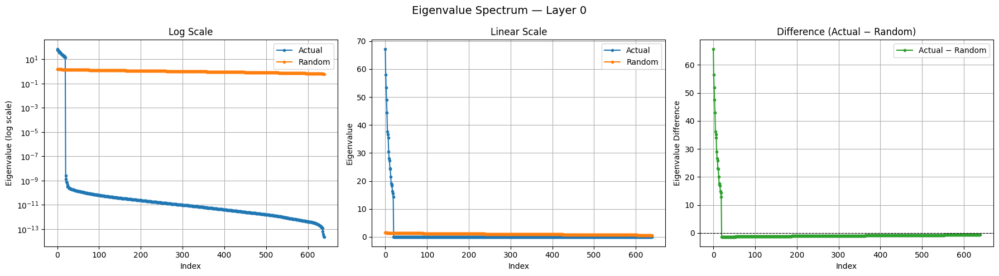

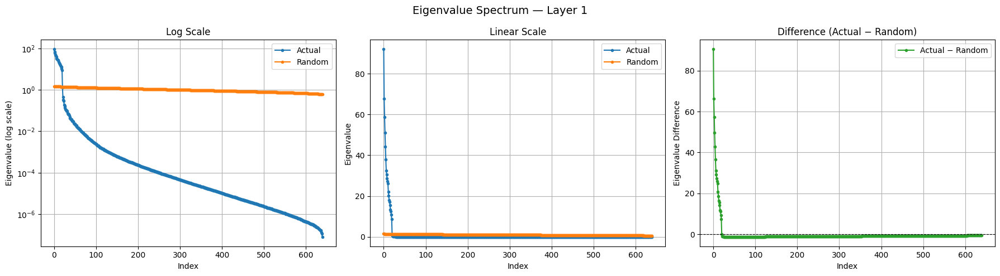

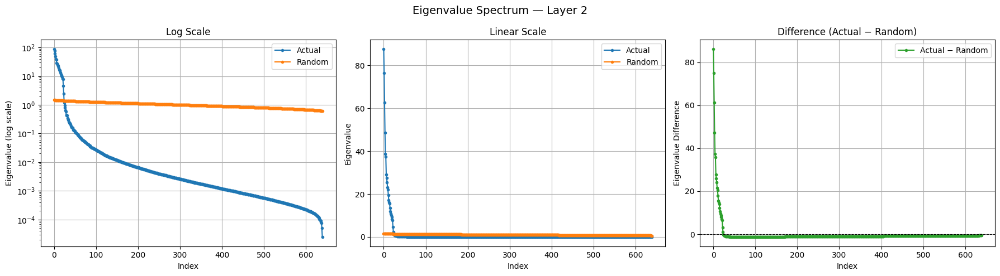

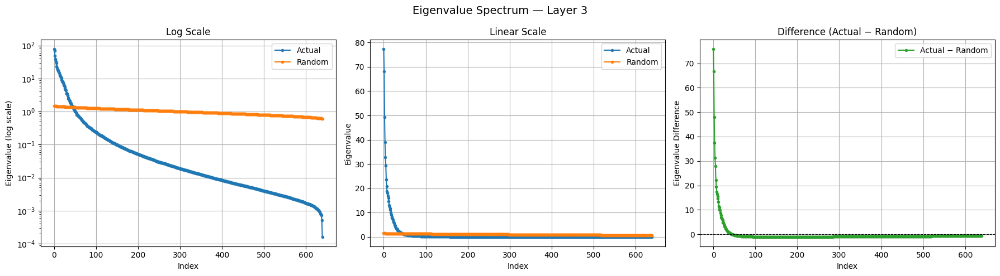

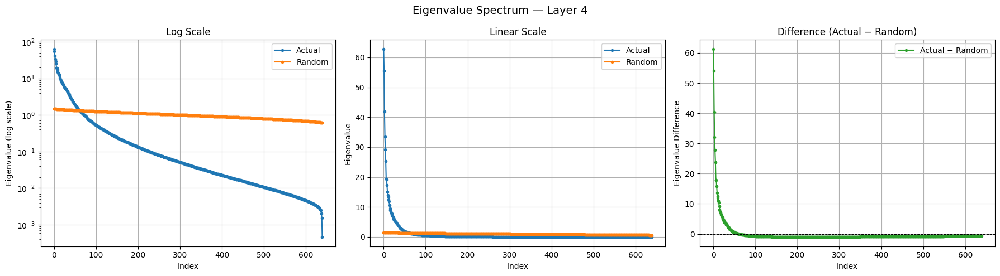

...

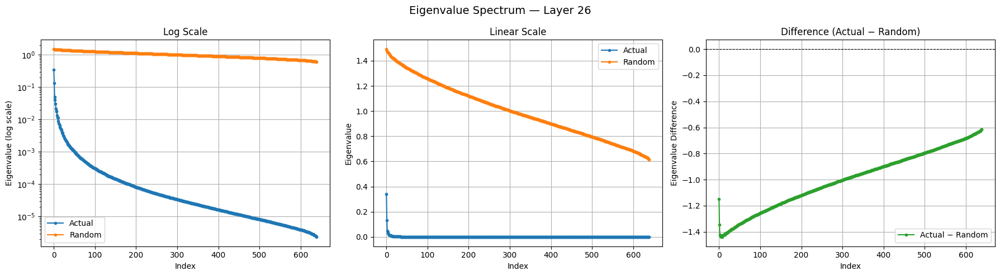

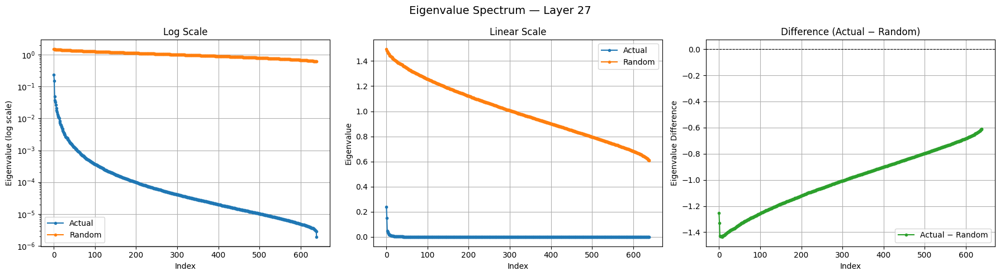

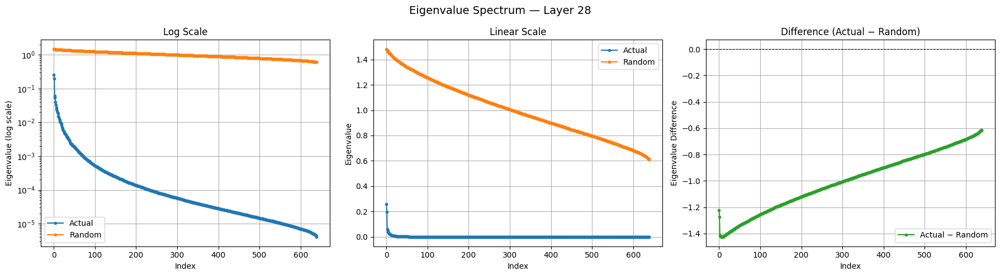

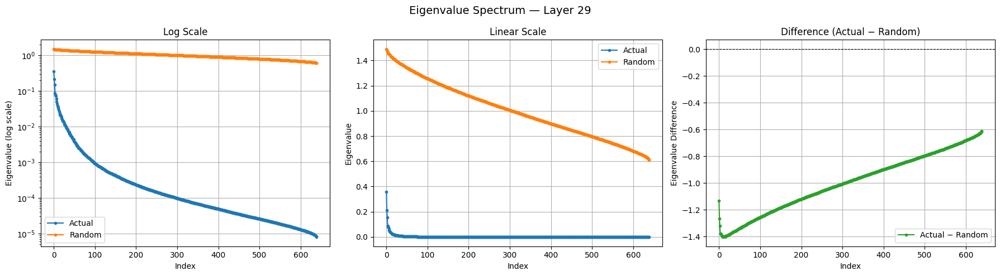

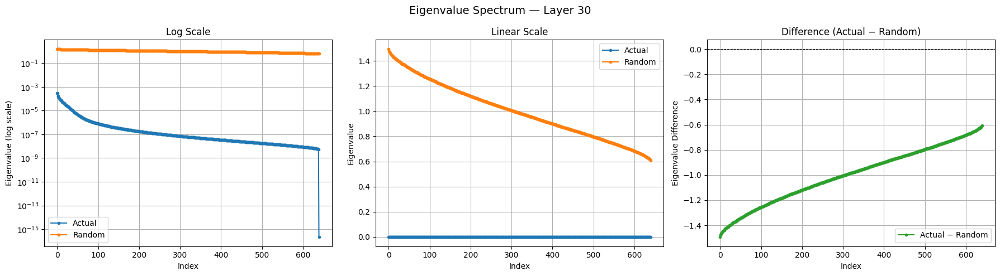

In [6]:
layers = 31

for layer in range(layers):
    final_df = load_final_df(layer, bf_path)
    plot_eigenvalue_spectrum(final_df, layer=layer)

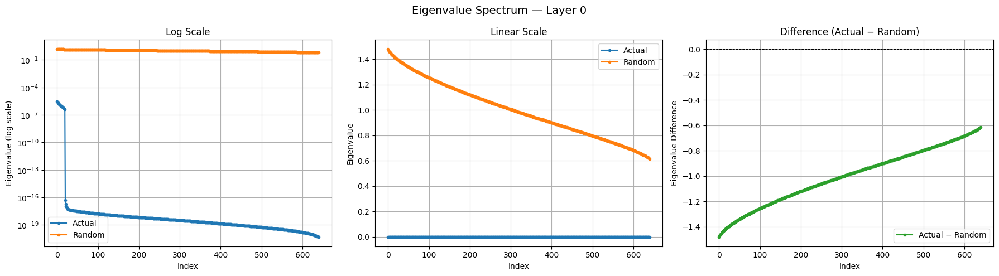

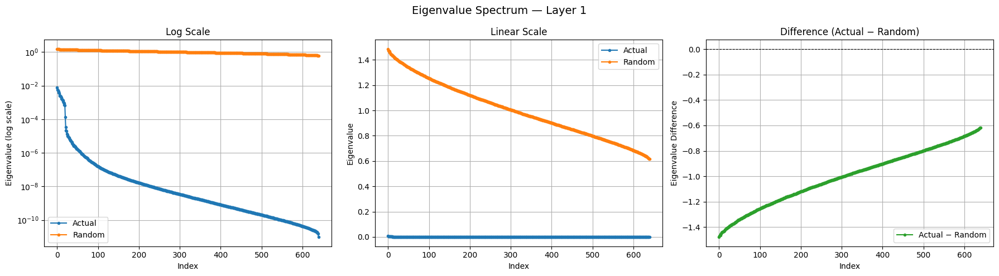

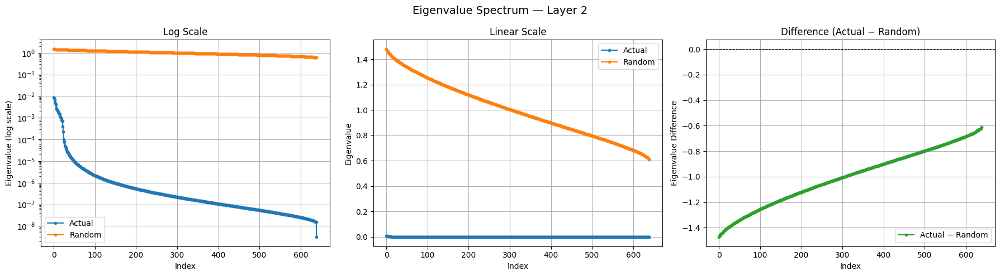

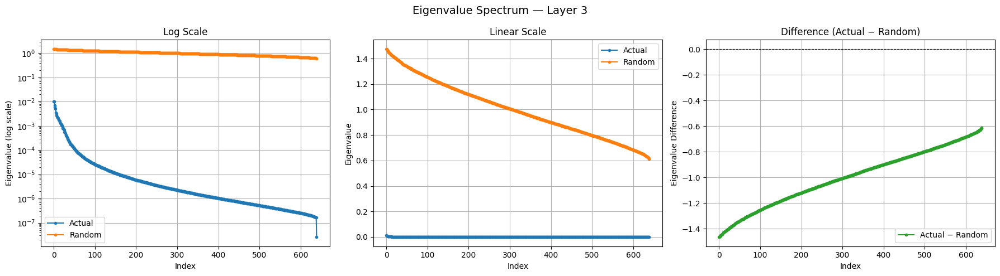

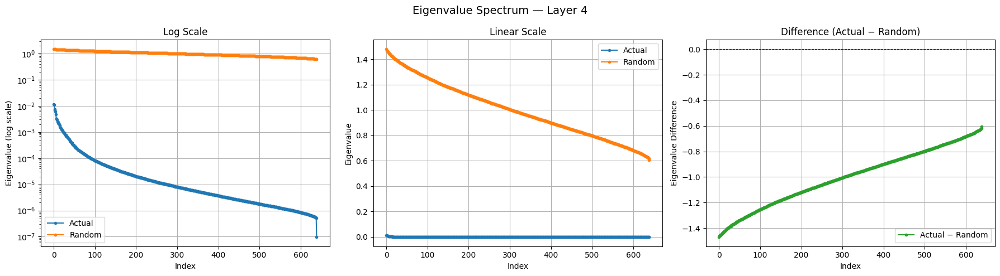

...

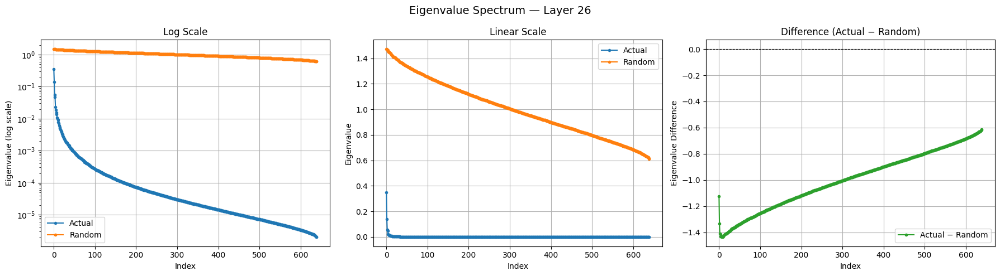

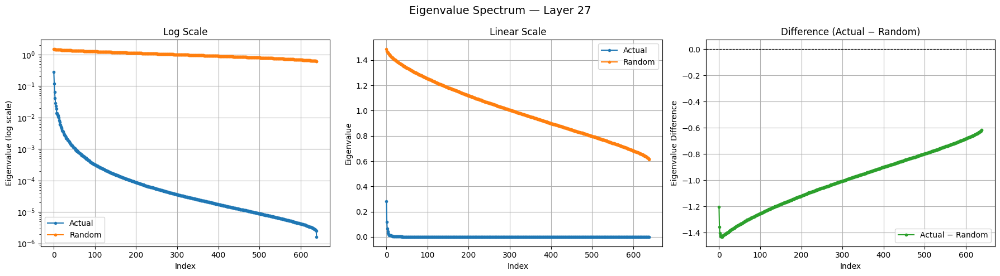

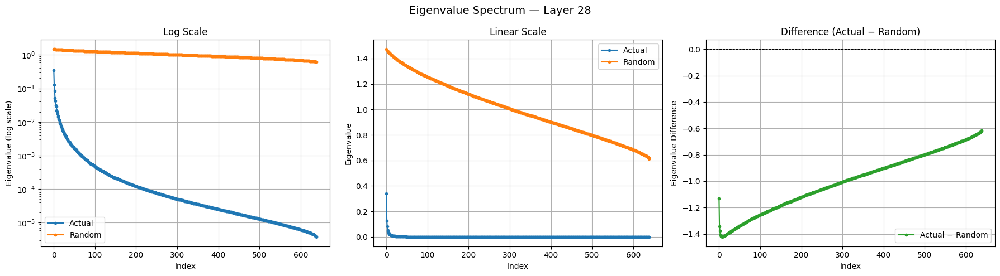

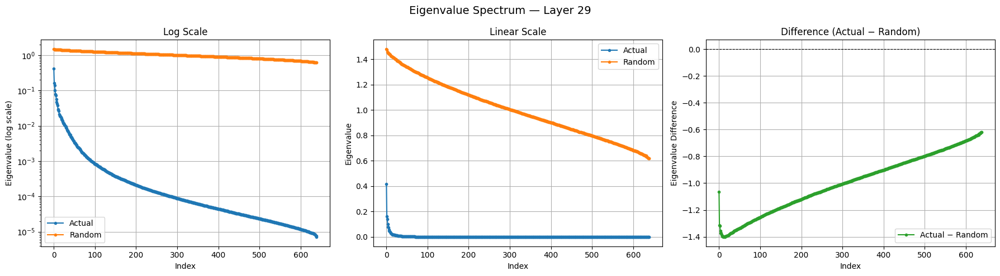

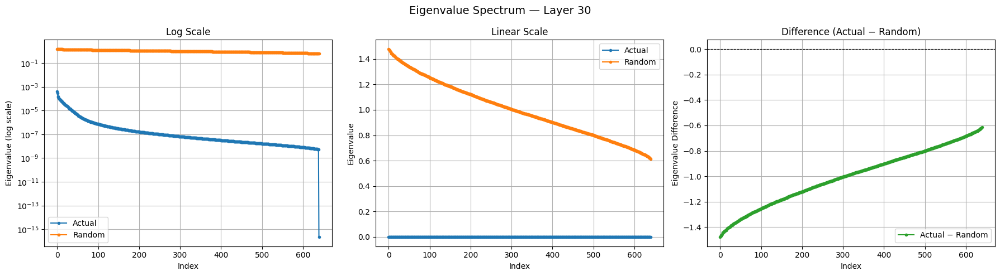

In [7]:
for layer in range(layers):
    final_df = load_final_df(layer, bg_path)
    plot_eigenvalue_spectrum(final_df, layer=layer)

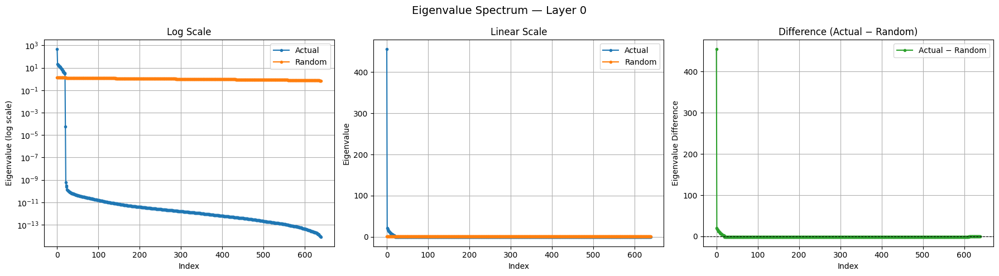

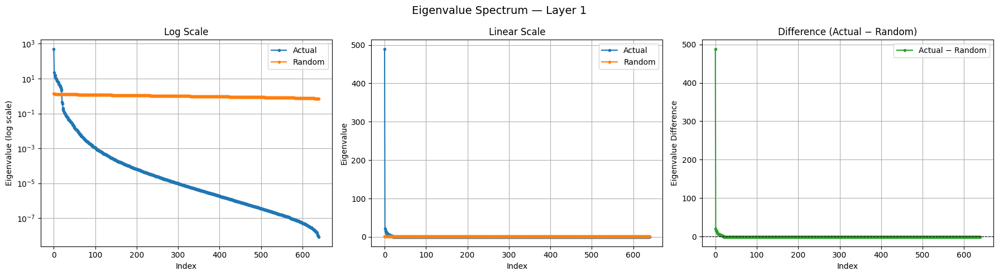

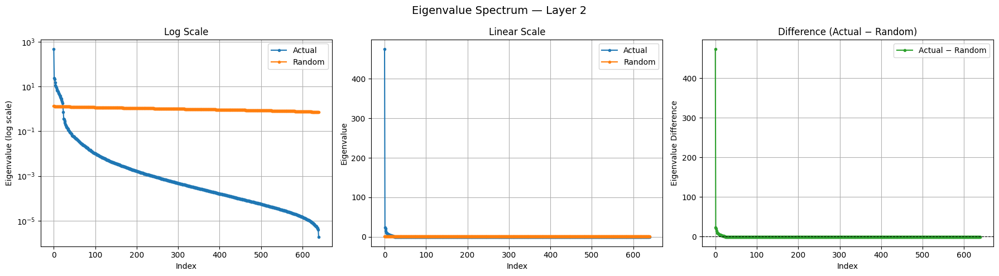

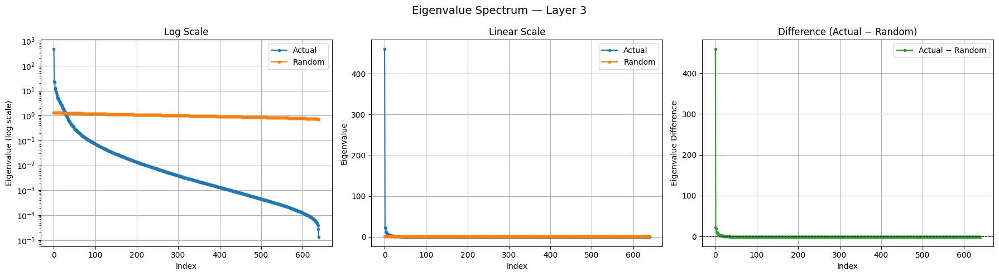

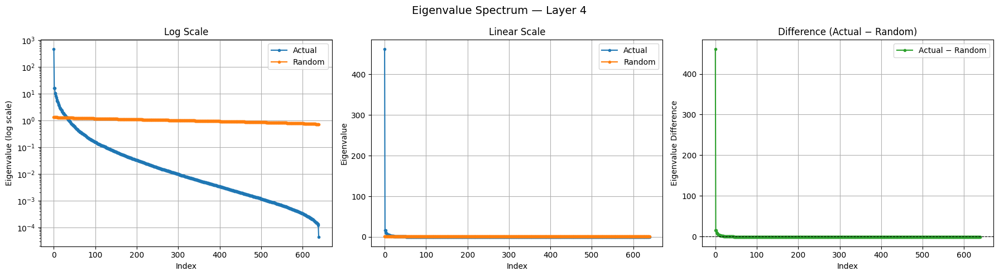

...

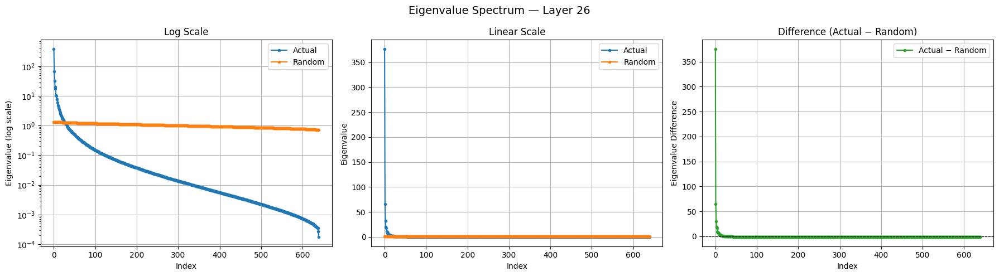

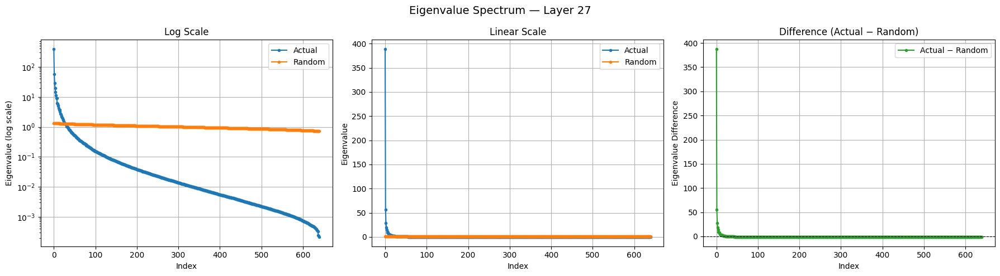

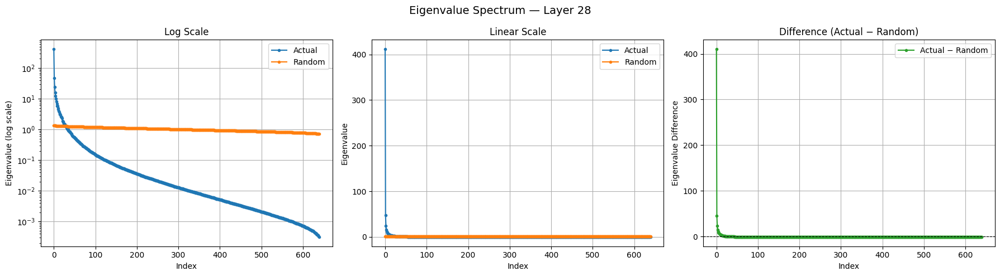

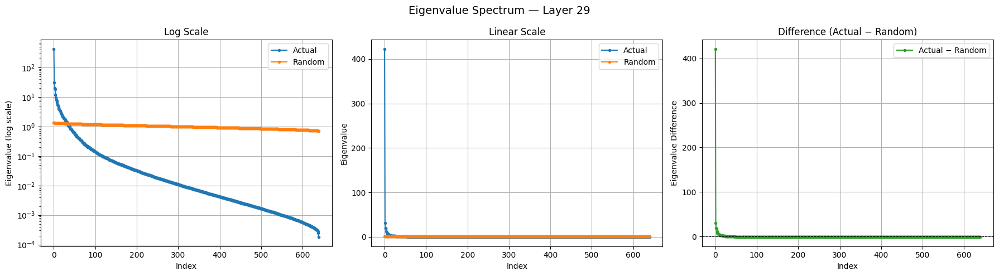

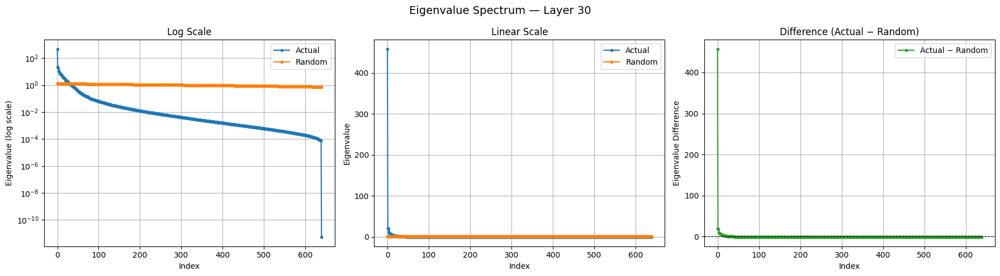

In [9]:
for layer in range(layers):
    final_df = load_final_df(layer)
    plot_eigenvalue_spectrum(final_df, layer=layer)

Analyzing layer 0...
Analyzing layer 1...
Analyzing layer 2...
Analyzing layer 3...
Analyzing layer 4...
Analyzing layer 5...
Analyzing layer 6...
Analyzing layer 7...
Analyzing layer 8...
Analyzing layer 9...
Analyzing layer 10...
Analyzing layer 11...
Analyzing layer 12...
Analyzing layer 13...
Analyzing layer 14...
Analyzing layer 15...
Analyzing layer 16...
Analyzing layer 17...
Analyzing layer 18...
Analyzing layer 19...
Analyzing layer 20...
Analyzing layer 21...
Analyzing layer 22...
Analyzing layer 23...
Analyzing layer 24...
Analyzing layer 25...
Analyzing layer 26...
Analyzing layer 27...
Analyzing layer 28...
Analyzing layer 29...
Analyzing layer 30...


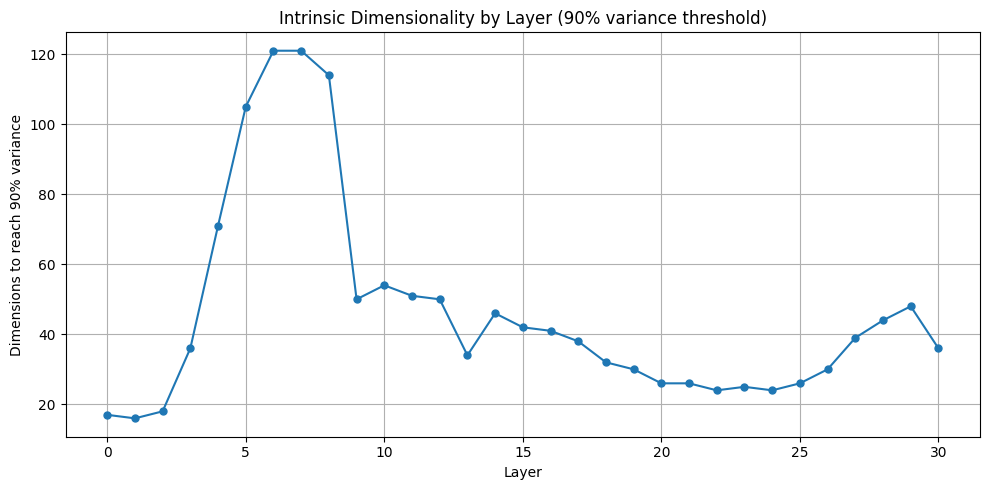

Analyzing layer 0...
Analyzing layer 1...
Analyzing layer 2...
Analyzing layer 3...
Analyzing layer 4...
Analyzing layer 5...
Analyzing layer 6...
Analyzing layer 7...
Analyzing layer 8...
Analyzing layer 9...
Analyzing layer 10...
Analyzing layer 11...
Analyzing layer 12...
Analyzing layer 13...
Analyzing layer 14...
Analyzing layer 15...
Analyzing layer 16...
Analyzing layer 17...
Analyzing layer 18...
Analyzing layer 19...
Analyzing layer 20...
Analyzing layer 21...
Analyzing layer 22...
Analyzing layer 23...
Analyzing layer 24...
Analyzing layer 25...
Analyzing layer 26...
Analyzing layer 27...
Analyzing layer 28...
Analyzing layer 29...
Analyzing layer 30...


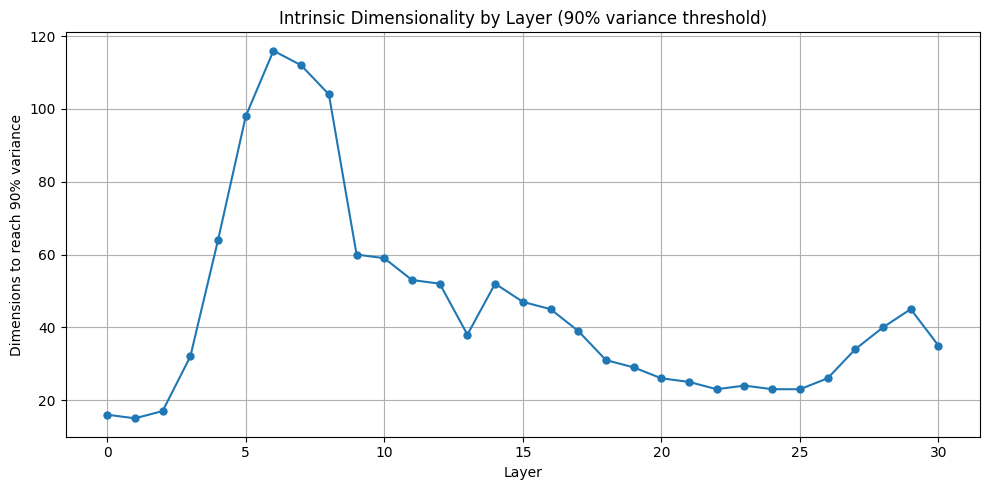

Analyzing layer 0...
Analyzing layer 1...
Analyzing layer 2...
Analyzing layer 3...
Analyzing layer 4...
Analyzing layer 5...
Analyzing layer 6...
Analyzing layer 7...
Analyzing layer 8...
Analyzing layer 9...
Analyzing layer 10...
Analyzing layer 11...
Analyzing layer 12...
Analyzing layer 13...
Analyzing layer 14...
Analyzing layer 15...
Analyzing layer 16...
Analyzing layer 17...
Analyzing layer 18...
Analyzing layer 19...
Analyzing layer 20...
Analyzing layer 21...
Analyzing layer 22...
Analyzing layer 23...
Analyzing layer 24...
Analyzing layer 25...
Analyzing layer 26...
Analyzing layer 27...
Analyzing layer 28...
Analyzing layer 29...
Analyzing layer 30...


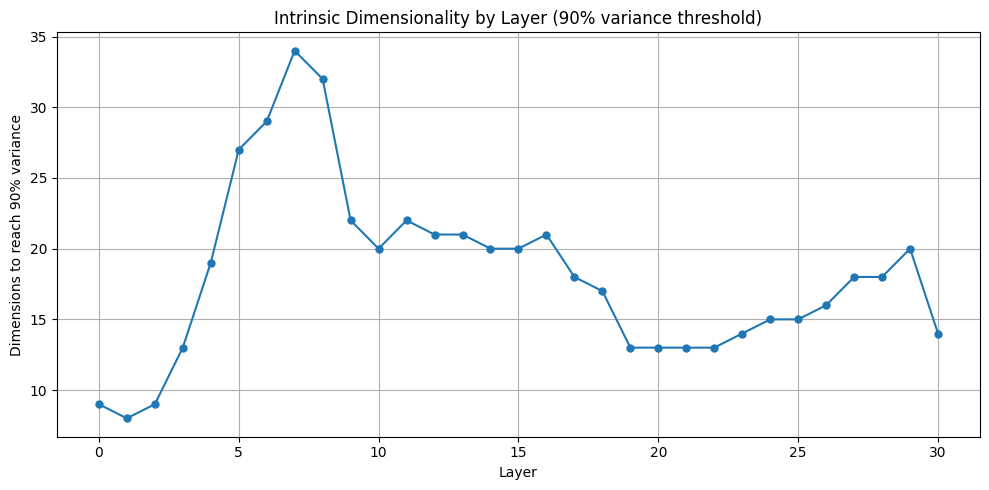

[9,
 8,
 9,
 13,
 19,
 27,
 29,
 34,
 32,
 22,
 20,
 22,
 21,
 21,
 20,
 20,
 21,
 18,
 17,
 13,
 13,
 13,
 13,
 14,
 15,
 15,
 16,
 18,
 18,
 20,
 14]

In [11]:
plot_intrinsic_dimensionality(num_layers=31, path=bf_path, threshold=0.90)
plot_intrinsic_dimensionality(num_layers=31, path=bg_path, threshold=0.90)
plot_intrinsic_dimensionality(num_layers=31, path=None, threshold=0.90)